# Key algorithms for drug discovery

In this notebook, we will basic and advanced techniques used to explore drug discovery problems. The notebook will use well known examples to facilitate the introduction of python packages and scientific methods. We expect from the reader a basic understanding of Python and Jupyter notebooks.

The material gathered here relies heavily on the extensive online documentation for [SciKit-Learn](https://scikit-learn.org/), as well as other sources. The reader is invited to explore the extive online literature as required, to expand on the topics covered here.

## Preamble
Load packages and define figure plotting options.

In [1]:
import pandas as pd
import numpy as np
import scipy as sp
import os

In [2]:
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

In [3]:
%matplotlib inline

In [4]:
plt.rcParams["figure.figsize"]=6,4
plt.rcParams['figure.dpi'] = 300

## Load and prepare data

In order to explore the topics covered in this chapter of the book, we will use data sets already available in SciKit-Learn:

The first is known as [Fisher's Iris data set](https://en.wikipedia.org/wiki/Iris_flower_data_set) and it describes length and the width measurements of petals and sepals from 150 plants, 50 samples from each of three species of Iris (_Iris setosa_, _Iris virginica_ and _Iris versicolor_). This famous data set has been used extensively in the ML literature. 

In [5]:
from sklearn.datasets import load_iris

iris = load_iris()
# iris

In [6]:
iris.data.shape

(150, 4)

The second is the [diabetes data set](https://scikit-learn.org/stable/datasets/toy_dataset.html#diabetes-dataset), which provides a more topical example. 10 different measurements were taken from 442 diabetes patients, from body mass and age to concentration of blood markers. Each data point is paired with a quantitative disease progression measurement for the respective patient.

In [7]:
from sklearn.datasets import load_diabetes

diabetes = load_diabetes()

In [8]:
diabetes.data.shape

(442, 10)

### Split training and testing sets

When training new ML models, it is important to carefully split your data and create separate training and testing data sets. Many ML model failures can be attributed to poorly distributed data or overlaping training and testing sets. 

Luckily, SciKit Learn already provides usefull functions that automate the process of data splitting. We will use it to create an 80/20 split, where 80% of the data will be used to train a model, and 20% will be used to evaluate it.

In [9]:
from sklearn.model_selection import train_test_split

iris_X_train, iris_X_test, iris_y_train, iris_y_test = train_test_split(
    iris.data, iris.target, test_size=0.2, random_state=12345)

In [10]:
db_X_train, db_X_test, db_y_train, db_y_test = train_test_split(
    diabetes.data, diabetes.target, test_size=0.2, random_state=12345)

The previous cells _randomly_ split the data in two groups, but since there is no true randomness in computers, we can provide a _random_state_ argument that will create the exact same "random" split every time the function is called. The reader is encouraged to change or remove the argument to see its effects on the creation of data sets. Controlling the random state of a function that splits data sets can be usefull when reproducibility is desired.

## Supervised VS Unsupervised: We don’t always need the answer

We will use the two data sets mentioned above to illustrate the difference between **supervised** and **unsupervised** learning.

The linear regression is probably the simplest **supervised** learning example one can explore. The model is given by the following relation:

$$
y = a_0 + a_1*x_1 + a_2*x_2 + \cdots + a_n*x_n
$$

### Predicting diabetes progression
Using the diabetes data set, we can train the model weights so that all 10 measurements taken from each patient are taken into account.

In [11]:
from sklearn import linear_model

# The LinearRegression functions creates a model object that provides training and prediction capabilities.
regr = linear_model.LinearRegression()

# The fit method is used to train the Linear Regression model. 
# Here we are using the 80% split of the data set that was dedicated for trainig.
regr.fit(db_X_train, db_y_train)

# Using the trained model, we can now make predictions. 
# We now use the 20% of the data set that was not used to train the model.
db_y_pred = regr.predict(db_X_test)

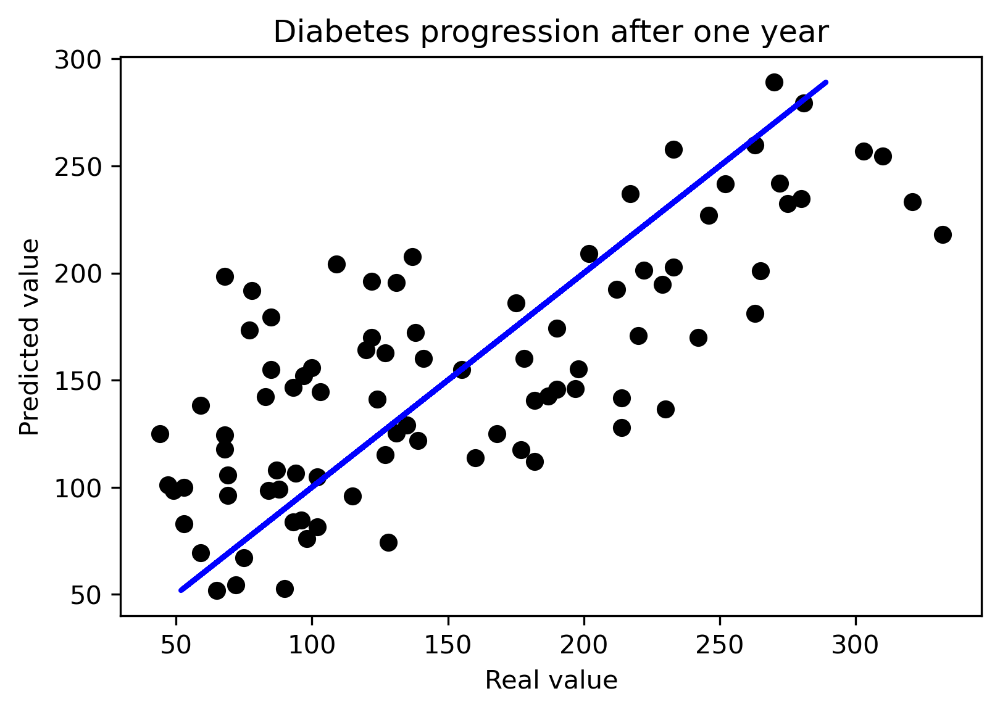

In [12]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(db_y_test, db_y_pred,  color='black')
plt.plot(db_y_pred, db_y_pred, color='blue', linewidth=2)

# Set figure title
ax.set_title('Diabetes progression after one year')
ax.set_xlabel('Real value')
ax.set_ylabel('Predicted value')

plt.show()

The scatter plot compares the real value for each patient and the value predicted by the model. A perfect model would have generated a perfect straight line where $y=x$, represented here by the blue line.
While the distribution of points shows the model is far from perfect, it is encouraging to see that the linear regression model is capable of capturing the overall trend.

We can analyze the weights learned by the model by reading the model coefficients:

In [13]:
regr.coef_

array([ -79.87562763, -240.8659298 ,  503.6780613 ,  320.98270076,
       -910.75963911,  577.48022353,  131.44205016,  217.8385027 ,
        783.95684738,   72.41216142])

We can also calculate the Pearson correlation between prediction and true disiease progression.

In [14]:
result = sp.stats.pearsonr(db_y_test, db_y_pred)
print("Pearson correlation coefficient: {}".format(round(result[0],3)))
print("P-value for non-correlation: {}".format(result[1]))

Pearson correlation coefficient: 0.743
P-value for non-correlation: 7.788295615762152e-17


### Grouping flowers
<table><tr>
<td> <img src="./Data/NotebookFigures/810px-Iris setosa.jpg" alt="setosa" style="height: 250px;"/> </td>
<td> <img src="./Data/NotebookFigures/1080px-Iris_versicolor.jpg" alt="versicolor" style="height: 250px;"/> </td>
<td> <img src="./Data/NotebookFigures/1080px-Iris_virginica_2.jpg" alt="virginica" style="height: 250px;"/> </td>
</tr></table>

The iris data set is a classical example used to illustrate clustering algorithms, an **unsupervided** learning test case that uses the flowers' charachteristics to predict its species. As a first example, we will use all 150 samples in our data set to train a K-Means clustering model, and then compare the groupings with the actual species each sample belong to.

In [15]:
from sklearn.cluster import KMeans

# Here we create a model object that provides training and prediction capabilities.
# Since KMeans needs to know the number of clusters to be created, 
#   we provide the number of iris species in the data set.
kmeans = KMeans(n_clusters=3, random_state=12345)

# With clustering models, it is possible to fit the data (i.e., train the model), and make 
#   clustering predictions at the same time, in a single function call.
iris_kmeans = kmeans.fit_predict(iris.data)

The following code creates 3D plots using 3 of the 4 attributes that describe each flower sample. 

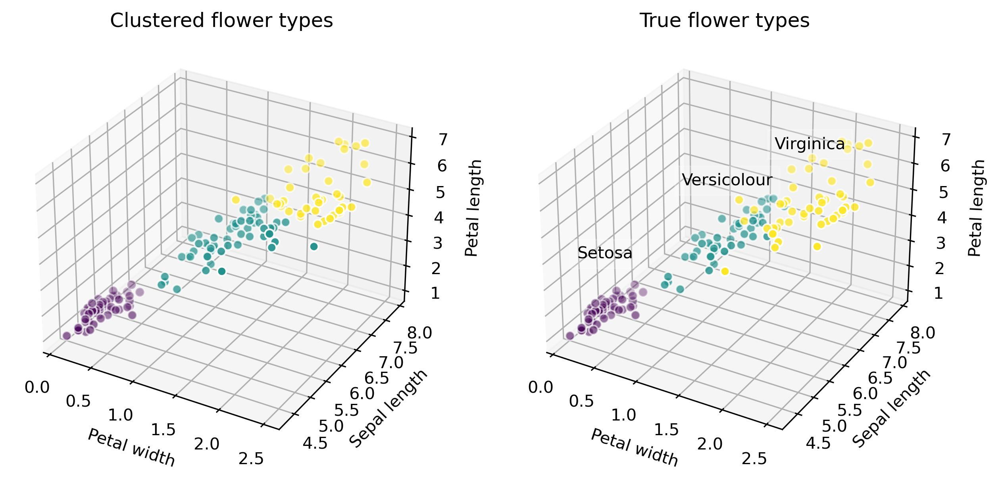

In [16]:
# Initialize figure
fig = plt.figure(figsize=(10, 5))

# Create the first sub-plot with points colored by clustering class.
ax = fig.add_subplot(1, 2, 1, projection='3d')

labels = kmeans.labels_
ax.scatter(iris.data[:, 3], iris.data[:, 0], iris.data[:, 2], s=30, 
           c=labels.astype(float), edgecolor='w')
ax.set_xlabel('Petal width')
ax.set_ylabel('Sepal length')
ax.set_zlabel('Petal length')
ax.set_title("Clustered flower types")

# Create the second sub-plot with points colored by the true class.
ax = fig.add_subplot(1, 2, 2, projection='3d')

# Reorder the labels to have colors matching the cluster results
labels_true = np.choose(iris.target, [0, 1, 2]).astype(float)

ax.scatter(iris.data[:, 3], iris.data[:, 0], iris.data[:, 2], s=30, 
           c=labels_true, edgecolor='w')
ax.set_xlabel('Petal width')
ax.set_ylabel('Sepal length')
ax.set_zlabel('Petal length')
ax.set_title("True flower types")
for name, label in [('Setosa', 0),
                    ('Versicolour', 1),
                    ('Virginica', 2)]:
    ax.text3D(iris.data[iris.target == label, 3].mean(),
              iris.data[iris.target == label, 0].mean(),
              iris.data[iris.target == label, 2].mean() + 2, name,
                  horizontalalignment='center',
                  bbox=dict(alpha=.2, edgecolor='w', facecolor='w'))
    
plt.show()

As we can see, the clustering algorithm makes a few mistakes, but manages to achieve a close clustering when given the correct number of clusters (in this case, N=3). However, we used all samples from our data set when training the model.

Could we use an **unsupervised** learning process to create a predictive model, such as the linear regression we saw above?

Indeed, we can, and we will use the same example from the Iris data set, but now using the same 80/20 split for train/test sata sets we used for the linear regression example.

In [17]:
from sklearn.cluster import KMeans

# Here we create a model object that provides training and prediction capabilities.
# Since KMeans needs to know the number of clusters to be created, 
#   we provide the number of iris species in the data set.
kmeans = KMeans(n_clusters=3, random_state=12345)

# Here, we train the model and predict classes for the training data set.
iris_kmeans_y_train = kmeans.fit_predict(iris_X_train)

# Independently, we predict classes for the samples in the testing data set.
iris_kmeans_y_test = kmeans.predict(iris_X_test)

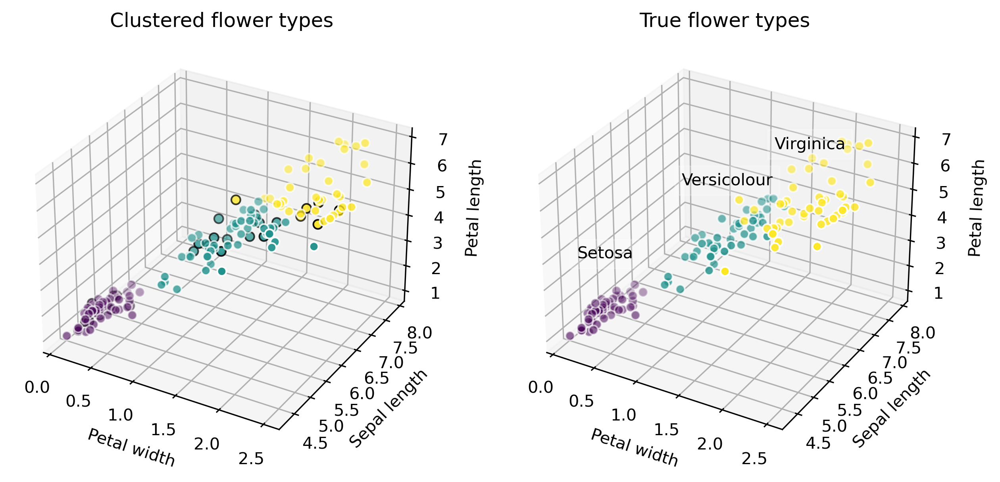

In [18]:
# Initialize figure
fig = plt.figure(figsize=(10, 5))

# Create the first sub-plot with points colored by clustering class.
ax = fig.add_subplot(1, 2, 1, projection='3d')

# Reorder the labels to have colors matching the cluster results
labels_iris_kmeans_y_test = np.choose(iris_kmeans_y_test, [2, 0, 1]).astype(float)
ax.scatter(iris_X_test[:, 3], iris_X_test[:, 0], iris_X_test[:, 2], s=30, 
           c=labels_iris_kmeans_y_test, edgecolor='k')


# Reorder the labels to have colors matching the cluster results
labels = np.choose(kmeans.labels_, [2, 0, 1]).astype(float)
ax.scatter(iris_X_train[:, 3], iris_X_train[:, 0], iris_X_train[:, 2], s=30, 
           c=labels.astype(float), edgecolor='w')

ax.set_xlabel('Petal width')
ax.set_ylabel('Sepal length')
ax.set_zlabel('Petal length')
ax.set_title("Clustered flower types")

# Create the second sub-plot with points colored by the true class.
ax = fig.add_subplot(1, 2, 2, projection='3d')

ax.scatter(iris.data[:, 3], iris.data[:, 0], iris.data[:, 2], s=30, 
           c=labels_true, edgecolor='w')
ax.set_xlabel('Petal width')
ax.set_ylabel('Sepal length')
ax.set_zlabel('Petal length')
ax.set_title("True flower types")
for name, label in [('Setosa', 0),
                    ('Versicolour', 1),
                    ('Virginica', 2)]:
    ax.text3D(iris.data[iris.target == label, 3].mean(),
              iris.data[iris.target == label, 0].mean(),
              iris.data[iris.target == label, 2].mean() + 2, name,
                  horizontalalignment='center',
                  bbox=dict(alpha=.2, edgecolor='w', facecolor='w'))
    
plt.show()

In this case, the spheres with black borders show clustering assignments made from points *not* used to train the model. Since the K-Means model was not trained knowing the true values of species to which the samples belonged, we can call this an **unsupervised** training. This exemplifies the process of using unlabelled data to train a clustering algorithm so it can be used to predict class assignments for new data (in this case, our testing data set).

## Dimensionality Reduction

As a first example, we can use the Principal Component Analysis method mentioned in the text to reduce the dimensionality of the Iris data set from 4 to 2.

In [19]:
from sklearn.decomposition import PCA

# Initialize the PCA object and directs it to project the data onto a 2D space.
pcaObj = PCA(n_components=2)

# In this case, the fit_transform method optimizes the principal components and projects the data set.
iris2D = pcaObj.fit_transform(iris.data)

# The PCA object can tell us variance ratio explained by each component.
pcaObj.explained_variance_ratio_

array([0.92461872, 0.05306648])

As we can see, projecting the Iris data set onto a 2D space is very reasonable since the two first principal components can explain over 97% of the variability of the data. In fact, the first PC seems to contain almost all information necessary to analyze this data set.

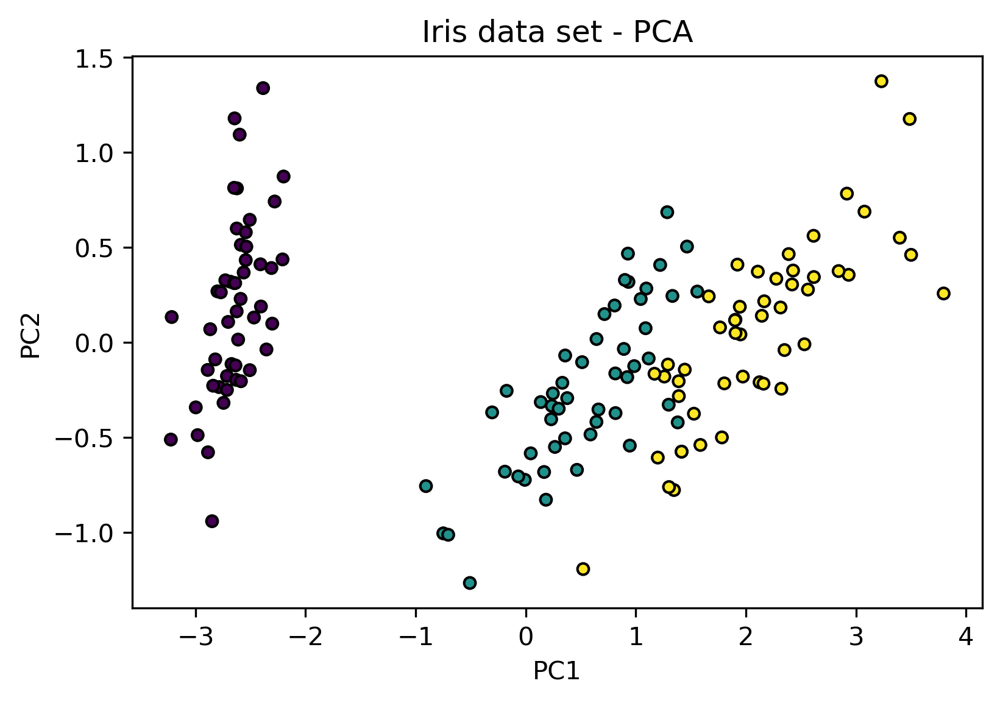

In [20]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(iris2D[:,0], iris2D[:,1],  
            c= np.choose(iris.target, [0, 1, 2]).astype(float), edgecolor='k', s=20)

# for name, label in [('Setosa', 0),
#                     ('Versicolour', 1),
#                     ('Virginica', 2)]:
#     ax.text(iris2D[iris.target == label, 0].mean(),
#             iris2D[iris.target == label, 1].mean(), name,
#                   horizontalalignment='center',
#                   bbox=dict(alpha=.2, edgecolor='w', facecolor='w'))

# Set figure title
ax.set_title('Iris data set - PCA')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')

plt.show()

Another common example is t-Distributed Stochastic Neighbor Embedding (tSNE), which randomly places points in a reduced dimensional space (e.g. projecting 4-dimensional data onto a 2D space) and attempts to recover the *local structure* of nearby neighbours, at the expense of precisely maintaining the distances of far-away points. This can be particularly interesting in very high-dimensional data sets as mentioned in the book.

In [21]:
# Load the tSNE class
from sklearn.manifold import TSNE

# Initialize the tSNE object and directs it to project the data onto a 2D space. 
# Warning! The "n_iter_without_progress" was reduced to avoid a very long processing time.
tsneObj = TSNE(n_components=2, n_iter=1000, n_iter_without_progress=50, random_state=12345)

# In this case, the fit_transform method optimizes the distances of nearby points in the reduced 2D space.
isirTSNE = tsneObj.fit_transform(iris.data)

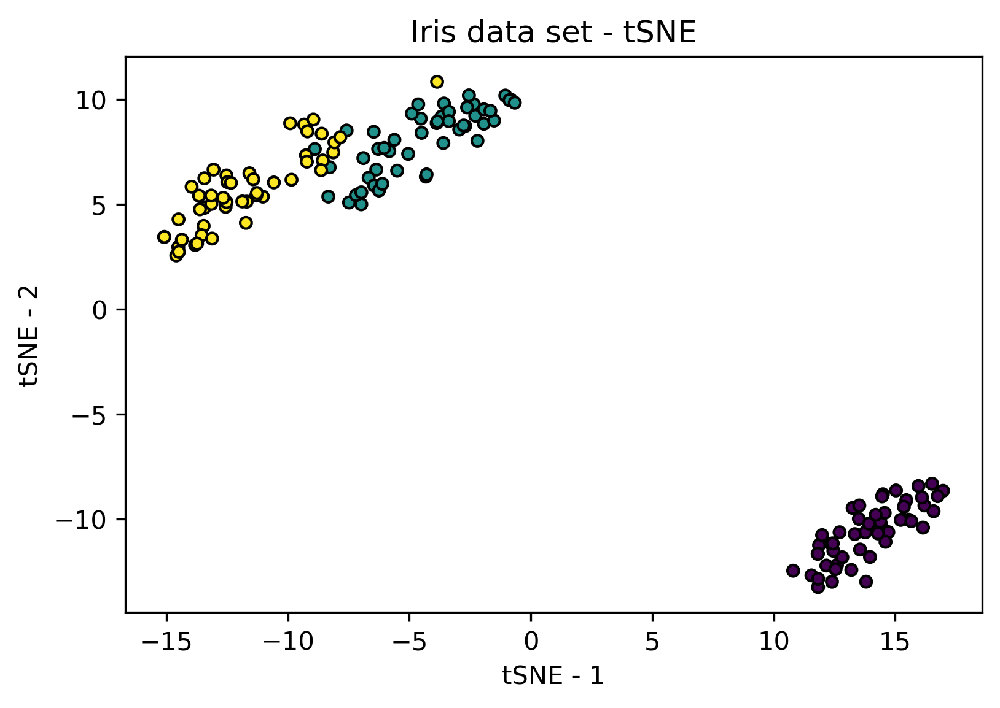

In [22]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(isirTSNE[:,0], isirTSNE[:,1],  
            c= np.choose(iris.target, [0, 1, 2]).astype(float), edgecolor='k', s=20)

# for name, label in [('Setosa', 0),
#                     ('Versicolour', 1),
#                     ('Virginica', 2)]:
#     ax.text(iris2D[iris.target == label, 0].mean(),
#             iris2D[iris.target == label, 1].mean(), name,
#                   horizontalalignment='center',
#                   bbox=dict(alpha=.2, edgecolor='w', facecolor='w'))

# Set figure title
ax.set_title('Iris data set - tSNE')
ax.set_xlabel('tSNE - 1')
ax.set_ylabel('tSNE - 2')

plt.show()

## Clustering Techniques

In order to explore clustering techniques and focus on the methods, we will create random data sets with pre-defined properties, suh as number of clusters and degree of noise. This is also a useful way to create artificial data to test new algorithms and hypotheses.

In [23]:
from sklearn.datasets import make_blobs

clustersDat, clustersClass = make_blobs(n_features=2, n_samples=1000, centers=3, random_state=12345)

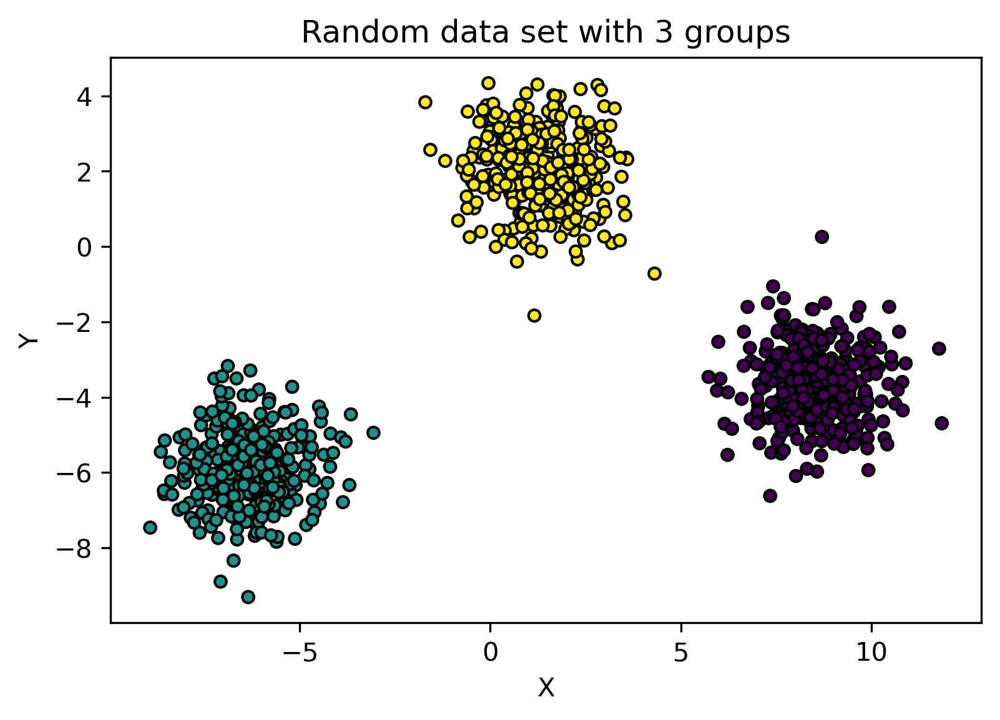

In [24]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(clustersDat[:,0], clustersDat[:,1],  
            c= clustersClass, edgecolor='k', s=20)

# Set figure title
ax.set_title('Random data set with 3 groups')
ax.set_xlabel('X')
ax.set_ylabel('Y')

plt.show()

Now we load our first contender: K-means.

In [25]:
from sklearn.cluster import KMeans

# Initialize the KMeans object and directs it to create 2 centroids.
kmeans = KMeans(n_clusters=2, random_state=12345)

# In this case, the fit_predict method optimizes the placement of centroids and predicts cluster assignment.
clustersPred = kmeans.fit_predict(clustersDat)

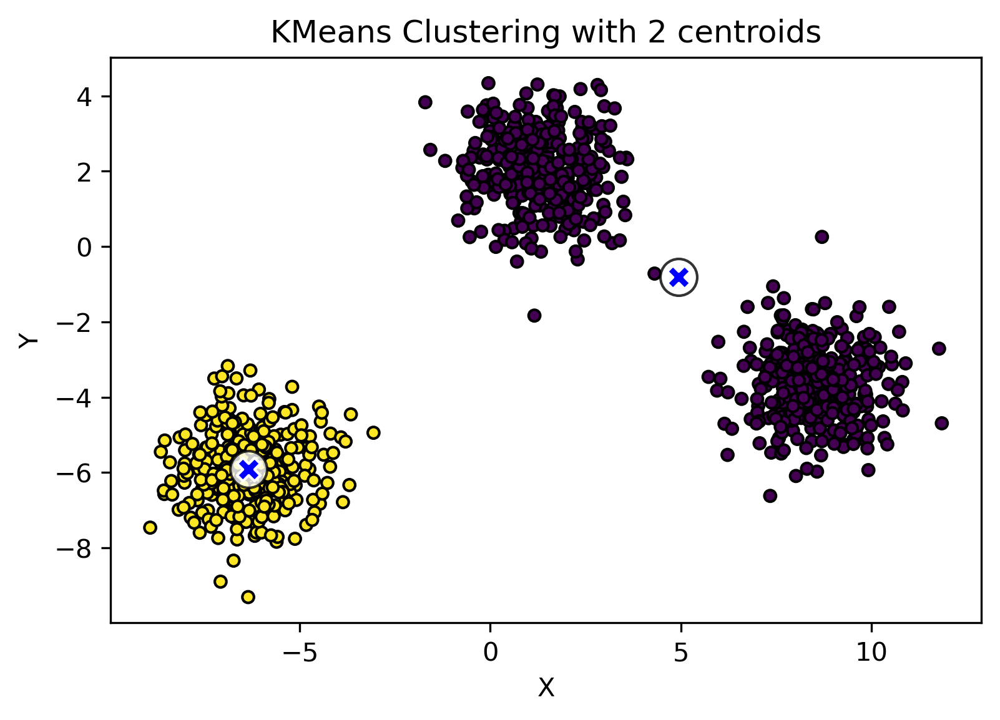

In [26]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(clustersDat[:,0], clustersDat[:,1],  
            c= clustersPred, edgecolor='k', s=20)

# Draw white circles at cluster centers
ax.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='o',
            c="white", alpha=0.8, s=200, edgecolor='k')

# Draw cluster centers
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker="X",
            s=80, color="blue", edgecolor='w')

# Set figure title
ax.set_title('KMeans Clustering with 2 centroids')
ax.set_xlabel('X')
ax.set_ylabel('Y')

plt.show()

Now we can try the same procedure looking for 3 clusters.

In [27]:
# Initialize the KMeans object and directs it to create 2 centroids.
kmeans = KMeans(n_clusters=3, random_state=12345)

# In this case, the fit_predict method optimizes the placement of centroids and predicts cluster assignment.
clustersPred = kmeans.fit_predict(clustersDat)

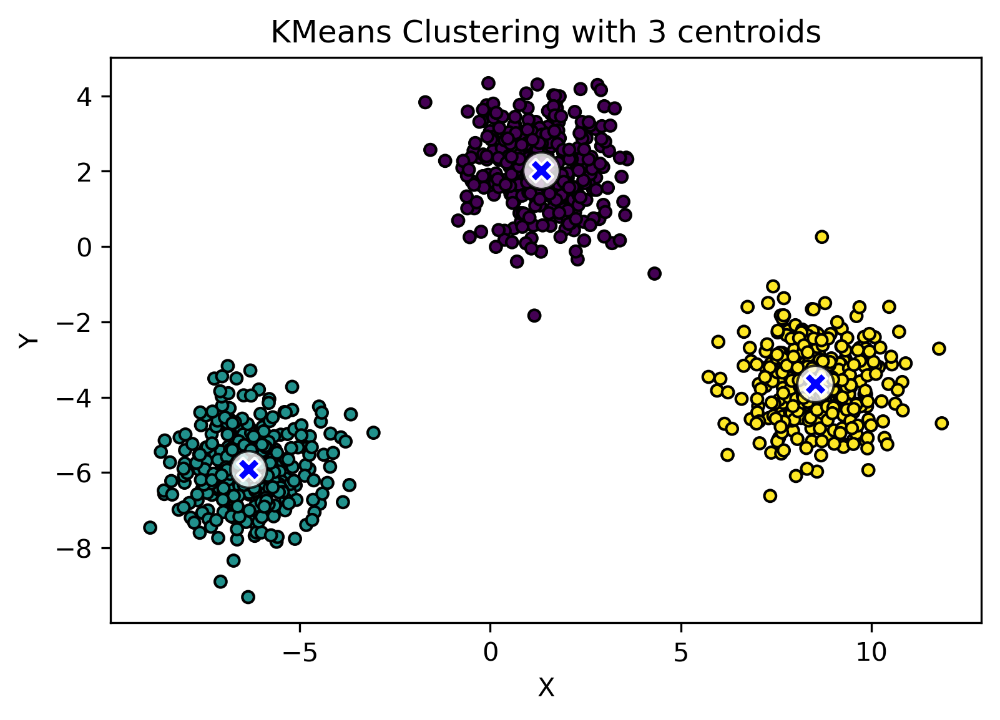

In [28]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(clustersDat[:,0], clustersDat[:,1],  
            c= clustersPred, edgecolor='k', s=20)

# Draw white circles at cluster centers
ax.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='o',
            c="white", alpha=0.8, s=200, edgecolor='k')

# Draw cluster centers
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker="X",
            s=80, color="blue", edgecolor='w')

# Set figure title
ax.set_title('KMeans Clustering with 3 centroids')
ax.set_xlabel('X')
ax.set_ylabel('Y')

plt.show()

Lets consider now a more complex example, were the number of clusters can be infered using performance metrics.

In [29]:
# blobs with varied variances
centers = [
    [0,0],
    [0,1],
    [1,0],
    [1,1],
    [0.5,2]
]
centers = np.asarray(centers)
variedBlobs, variedBlobsClasses = make_blobs(n_features=2, n_samples=1000, centers=centers,
                                             cluster_std=[0.05, 0.2, 0.10, 0.2, 0.25], 
                                             random_state=12345)

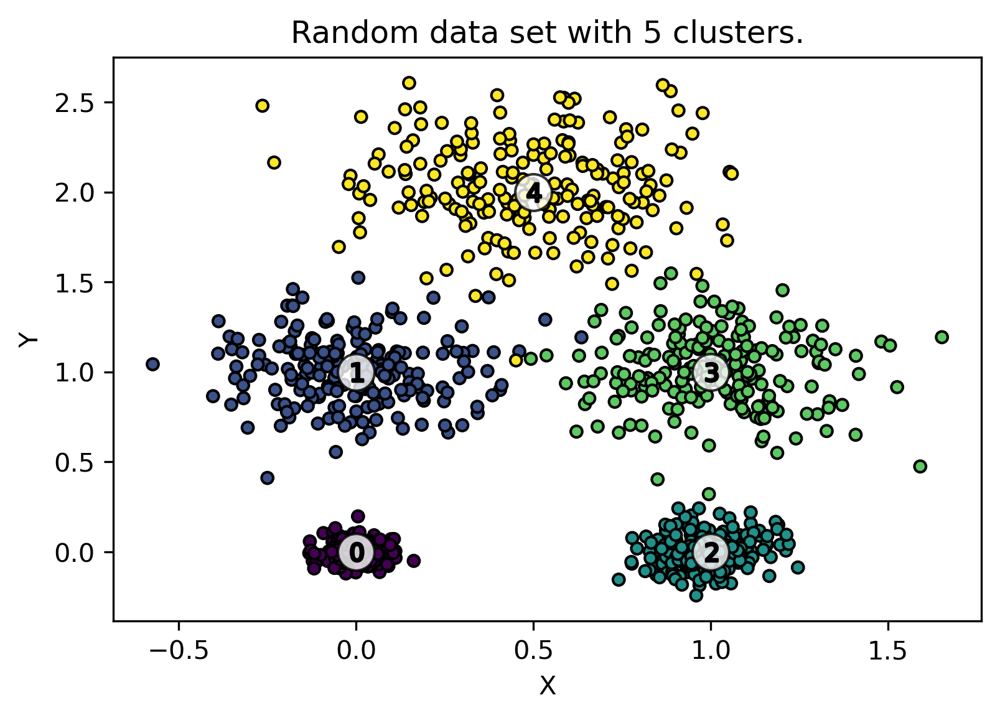

In [30]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(variedBlobs[:,0], variedBlobs[:,1],  
            c= variedBlobsClasses, edgecolor='k', s=20)

# Set figure title
ax.set_title('Random data set with 5 clusters.')
ax.set_xlabel('X')
ax.set_ylabel('Y')

# Draw white circles at cluster centers
ax.scatter(centers[:, 0], centers[:, 1], marker='o',
            c="white", alpha=0.8, s=200, edgecolor='k')

# Draw cluster ID over each groups
for i, c in enumerate(centers):
    ax.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                s=50, edgecolor='k')

plt.show()

Using the Silhouette Score, we can estimate how well a given number of clusters models the data being analyzed. This score takes into account the mean distances between points in a given cluster, and distances between points of closest nearby clusters. In an ideal case, the score would be 1, indicating perfectly assigned and very dense clusters. Our example is more challenging than that, with dispersed points and slightly overlaping clusters.

In [31]:
from sklearn.metrics import silhouette_score, silhouette_samples

clusterRange = [2,3,4,5,6,7,8,9,10]

avgSilhouetteList = []
avgSiltMap = {}
samplSiltMap = {}

for numClusters in clusterRange:
    
    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmeans = KMeans(n_clusters=numClusters, random_state=12345)
    blobsLabs = kmeans.fit_predict(variedBlobs)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(variedBlobs, blobsLabs)
    print("For n_clusters =", numClusters,
          "The average silhouette_score is :", silhouette_avg)
    avgSilhouetteList.append(silhouette_avg)
    avgSiltMap[numClusters] = silhouette_avg

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(variedBlobs, blobsLabs)
    samplSiltMap[numClusters] = sample_silhouette_values


For n_clusters = 2 The average silhouette_score is : 0.4721632740972793
For n_clusters = 3 The average silhouette_score is : 0.4920198420564495
For n_clusters = 4 The average silhouette_score is : 0.5578386599321614
For n_clusters = 5 The average silhouette_score is : 0.6985048326719707
For n_clusters = 6 The average silhouette_score is : 0.6447437810700964
For n_clusters = 7 The average silhouette_score is : 0.6424770668144478
For n_clusters = 8 The average silhouette_score is : 0.5844429050801327
For n_clusters = 9 The average silhouette_score is : 0.537821578763261
For n_clusters = 10 The average silhouette_score is : 0.5413784404542364


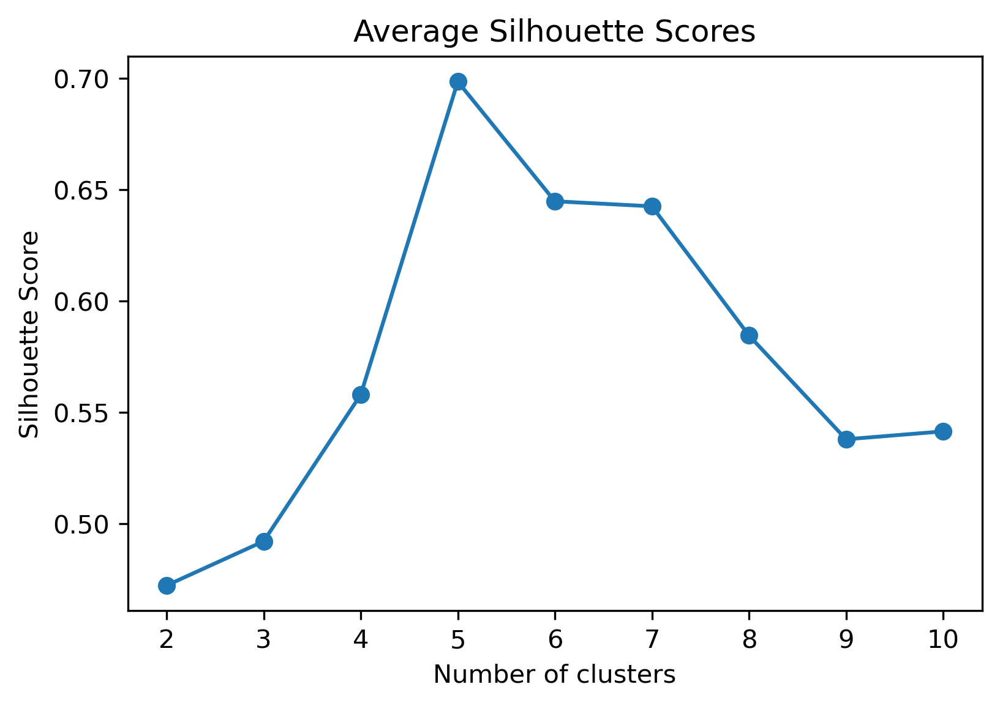

In [32]:
# Initialize figure
fig, ax = plt.subplots()

# Draw white circles at cluster centers
ax.plot(clusterRange, avgSilhouetteList, marker='o')

# Set figure title
ax.set_title('Average Silhouette Scores')
ax.set_xlabel('Number of clusters')
ax.set_ylabel('Silhouette Score')

plt.show()

In the following cell, we can create individual plots assuming different numbers of clusters, and see how the distribution of points over the clusters affect the silhouette values.
The reader is encouraged to change the number of requested clusters and explore the effects.

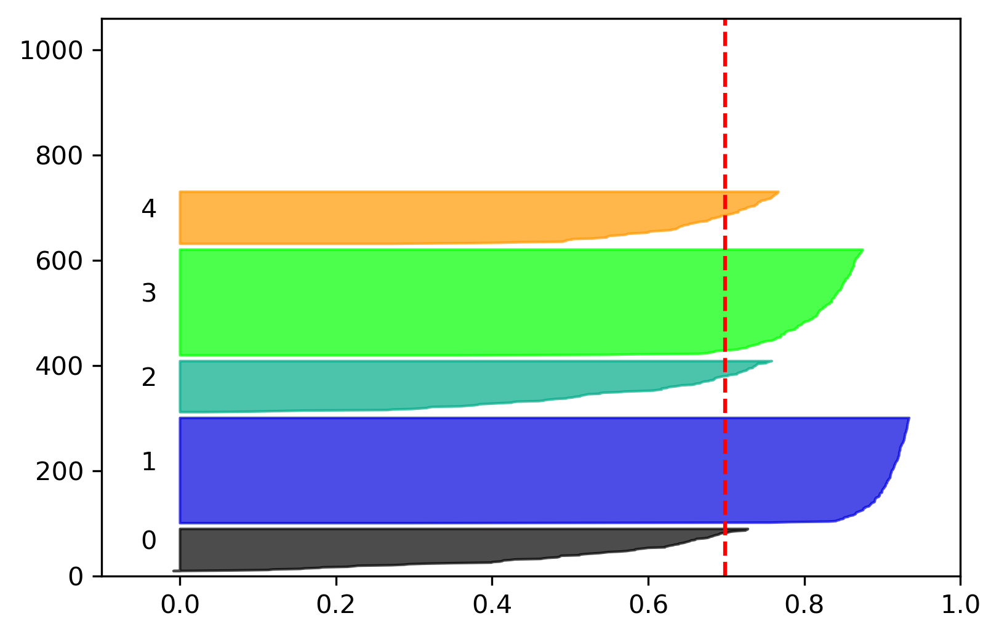

In [33]:

######
#
numClusters = 5
#
######

sample_silhouette_values = samplSiltMap[numClusters]
silhouette_avg = avgSiltMap[numClusters]

# Initialize figure
fig, ax1 = plt.subplots()

# Silhouette Plot
# The silhouette coefficient can range from -1, 1 but in this example all
# lie within [-0.1, 1]
ax1.set_xlim([-0.1, 1])
# The (n_clusters+1)*10 is for inserting blank space between silhouette
# plots of individual clusters, to demarcate them clearly.
ax1.set_ylim([0, len(variedBlobs) + (numClusters + 1) * 10])

y_lower = 10
for i in range(numClusters):
    # Aggregate the silhouette scores for samples belonging to
    # cluster i, and sort them
    ith_cluster_silhouette_values = \
        sample_silhouette_values[blobsLabs == i]

    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    color = cm.nipy_spectral(float(i) / numClusters)
    ax1.fill_betweenx(np.arange(y_lower, y_upper),
                      0, ith_cluster_silhouette_values,
                      facecolor=color, edgecolor=color, alpha=0.7)

    # Label the silhouette plots with their cluster numbers at the middle
    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

    # Compute the new y_lower for next plot
    y_lower = y_upper + 10  # 10 for the 0 samples
    
# The vertical line for average silhouette score of all the values
ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    
plt.show()

### Clustering Benchmarks
Now for a more elaborate comparison of clustering techniques available in SciKit Learn, we can explore a collection of data sets that present different properties and challenges. 

The 5 data sets are created using fnctions that randomly place points according to distributions paraters. The distribution patterns are:
- Concentric circles
- Half moons
- Overlaping clusters
- Asymmetric clusters
- Simple disjoint dense clusters

The algorithms used are:
- K-means
- DBSCAN
- Gaussian Mixture

As we will see, all clustering algorithms perform well on the simplest of cases, the disjoint dense clusters, but the other patterns may present challenges.

This example is heavily based on a [comparison of lustering algorithms](https://scikit-learn.org/stable/auto_examples/cluster/plot_cluster_comparison.html), where the reader can find more details on the data sets and method being employed.

In [34]:
### Prepare data sets described above.

from sklearn.datasets import make_circles, make_moons, make_blobs
from sklearn.preprocessing import StandardScaler

n_samples = 1500

# Prepare data distributed in concentric circles
noisy_circles = make_circles(n_samples=n_samples, factor=.5,
                                      noise=.05)

# Prepare data distributed in half moons
noisy_moons = make_moons(n_samples=n_samples, noise=.05)

# Prepare overlaping clusters 
varied = make_blobs(n_samples=n_samples,
                             cluster_std=[1.0, 2.5, 0.5],
                             random_state=170)

# Prepare asymmetric clusters (Anisotropicly distributed data)
X, y = make_blobs(n_samples=n_samples, random_state=170)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)

# Prepare disjoint dense clusters
blobs = make_blobs(n_samples=n_samples, random_state=8)

In the following cell we fit each model and prepare each corresponding plot simultaneously.

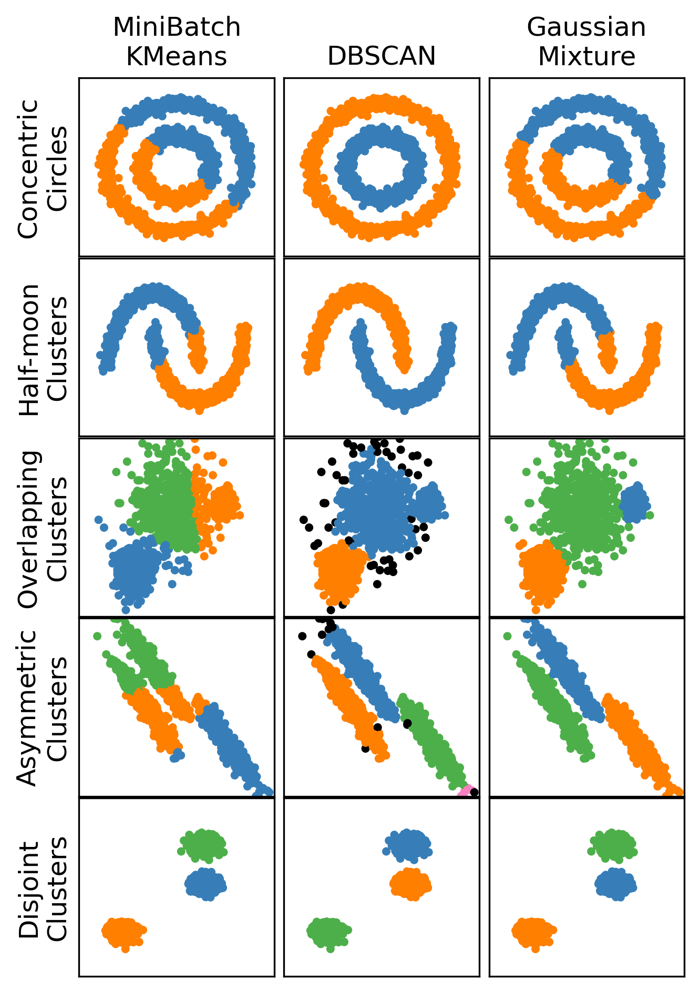

In [35]:
from sklearn.cluster import MiniBatchKMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from itertools import cycle, islice
import time

plt.figure(figsize=(4, 6))
plt.subplots_adjust(left=.02, right=.98, bottom=.001, top=.95, wspace=.05,
                    hspace=.01)

plot_num = 1

default_base = {'quantile': .3,
                'eps': .3,
                'damping': .9,
                'preference': -200,
                'n_neighbors': 10,
                'n_clusters': 3,
                'min_samples': 20,
                'xi': 0.05,
                'min_cluster_size': 0.1}

# Orders the data sets and respective parameters to be used by clustering algorithms.
datasets = [
    (noisy_circles, {'damping': .77, 'preference': -240,
                     'quantile': .2, 'n_clusters': 2,
                     'min_samples': 20, 'xi': 0.25}),
    (noisy_moons, {'damping': .75, 'preference': -220, 'n_clusters': 2}),
    (varied, {'eps': .18, 'n_neighbors': 2,
              'min_samples': 5, 'xi': 0.035, 'min_cluster_size': .2}),
    (aniso, {'eps': .15, 'n_neighbors': 2,
             'min_samples': 20, 'xi': 0.1, 'min_cluster_size': .2}),
    (blobs, {})]

datasetsLabels = ["Concentric\nCircles",
                  "Half-moon\nClusters",
                  "Overlapping\nClusters",
                  "Asymmetric\nClusters",
                  "Disjoint\nClusters",
                 ]

for i_dataset, (dataset, algo_params) in enumerate(datasets):
    # update parameters with dataset-specific values
    params = default_base.copy()
    params.update(algo_params)

    X, y = dataset

    # normalize dataset for easier parameter selection
    X = StandardScaler().fit_transform(X)

    # ============
    # Create cluster objects
    # ============
    two_means = MiniBatchKMeans(n_clusters=params['n_clusters'])
    dbscan = DBSCAN(eps=params['eps'])
    gmm = GaussianMixture(
        n_components=params['n_clusters'], covariance_type='full')

    clustering_algorithms = (
        ('MiniBatch\nKMeans', two_means),
        ('DBSCAN', dbscan),
        ('Gaussian\nMixture', gmm)
    )

    for algoIndx, (name, algorithm) in enumerate(clustering_algorithms):
        
        # Fit the clustering model.
        algorithm.fit(X)
        
        if hasattr(algorithm, 'labels_'):
            y_pred = algorithm.labels_.astype(int)
        else:
            y_pred = algorithm.predict(X)

        plt.subplot(len(datasets), len(clustering_algorithms), plot_num)
        if i_dataset == 0:
            plt.title(name, size=12)
        
        if algoIndx == 0:
            plt.ylabel(datasetsLabels[i_dataset], size=12)
        
        colors = np.array(list(islice(cycle(['#377eb8', '#ff7f00', '#4daf4a',
                                             '#f781bf', '#a65628', '#984ea3',
                                             '#999999', '#e41a1c', '#dede00']),
                                      int(max(y_pred) + 1))))
        # add black color for outliers (if any)
        colors = np.append(colors, ["#000000"])
        plt.scatter(X[:, 0], X[:, 1], s=8, color=colors[y_pred])

        plt.xlim(-2.5, 2.5)
        plt.ylim(-2.5, 2.5)
        plt.xticks(())
        plt.yticks(())
        
        plot_num += 1

plt.show()

The plots show the cluster assignments for a variety of data distribution patterns and three different clustering algorithms. As we can see, DBSCAN is the only one capable of identifying the two concentric circles as distinct clusters, but it fails to assign clusters to all outliers from the overlapping clusters. It also produces a spurious fourth cluster in the asymmetric distributions. Gaussian Mixtures achieve the best performance in both overlapping cluster and asymmetric clusters datasets, but also struggles to identify the concentric clusters and half-moon patterns. In the simplest case of disjoint dense clusters, all algorithms perform well.

## Support Vector Machines

Here we will use the Iris data set again to train SMV classifier models to predict sample species. We will first use a low dimensionality approach and try to classify samples using only the first two dimensions of the data set. The we will try using all four varaiables that describe flower measurements, and finally we will try using the two first PCA components found previously in this notebook. The plots are made using the PCA representation, to facilitate visualization.

In [36]:
from sklearn.svm import LinearSVC, SVC, LinearSVR, SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

In [37]:
irisLD_X_train, irisLD_X_test, irisLD_y_train, irisLD_y_test = train_test_split(
    iris.data[:,0:2], iris.target, test_size=0.2, random_state=12345)

In [38]:
svcIrisLD = make_pipeline(StandardScaler(),
                    LinearSVC(random_state=0, tol=1e-5))

svcIrisLD.fit(irisLD_X_train, irisLD_y_train)

irisLD_y_pred = svcIrisLD.predict(irisLD_X_test)

Now we plot the points and predictions. Feel free to correlate the classifications below with the original PCA plot we created above.
Predicted classifications are marked with a black edge surounding the colored point.

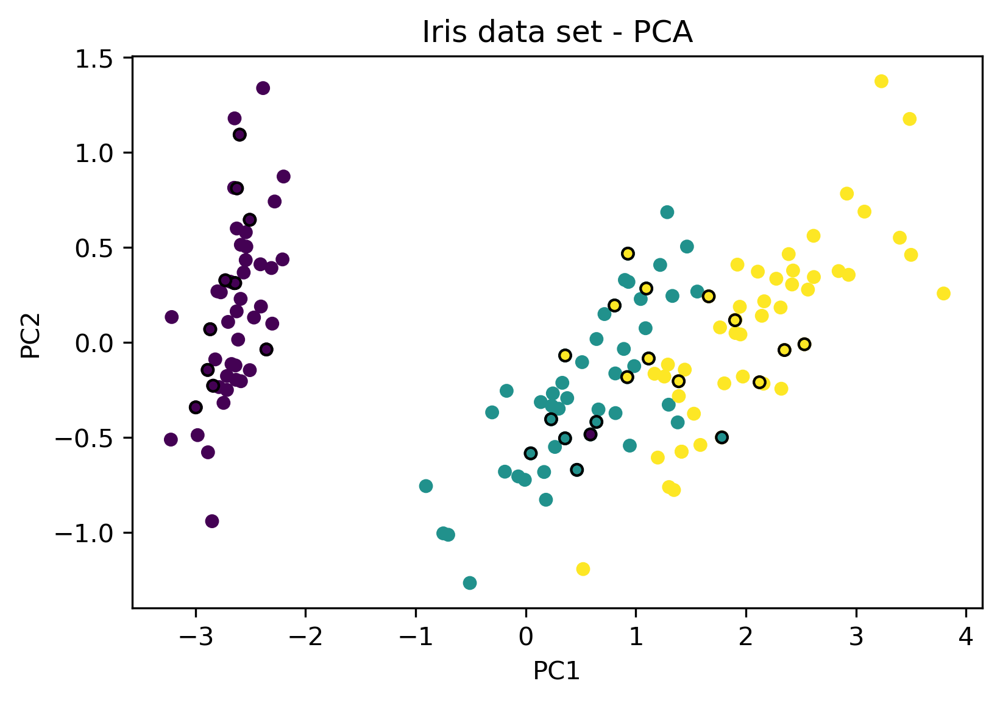

In [39]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(iris2D[:,0], iris2D[:,1],  
            c= np.choose(iris.target, [0, 1, 2]).astype(float), s=20)

# Create scatter plot
plt.scatter(pcaObj.transform(iris_X_test)[:,0], pcaObj.transform(iris_X_test)[:,1],  
            c=irisLD_y_pred, edgecolor='k', s=20)

# for name, label in [('Setosa', 0),
#                     ('Versicolour', 1),
#                     ('Virginica', 2)]:
#     ax.text(iris2D[iris.target == label, 0].mean(),
#             iris2D[iris.target == label, 1].mean(), name,
#                   horizontalalignment='center',
#                   bbox=dict(alpha=.2, edgecolor='w', facecolor='w'))

# Set figure title
ax.set_title('Iris data set - PCA')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')

plt.show()

In [40]:
score = svcIrisLD.score(irisLD_X_test, irisLD_y_test)

print("The model accuracy is {}%".format(int(round(score, 2)*100)))

The model accuracy is 73%


Even though the Setosa (purple left-most cluster) is well defined with only one misclassified point among the Versicolour and Virginica clusters, the last two clusters show significant cross classification, and an overall 73% model accuracy.

Now we will create new training and testing sets using all four dimensions present in this data set.

In [41]:
iris_X_train, iris_X_test, iris_y_train, iris_y_test = train_test_split(
    iris.data, iris.target, test_size=0.2, random_state=12345)

In [42]:
svcIris = make_pipeline(StandardScaler(),
                    LinearSVC(random_state=0, tol=1e-5))

svcIris.fit(iris_X_train, iris_y_train)

iris_y_pred = svcIris.predict(iris_X_test)

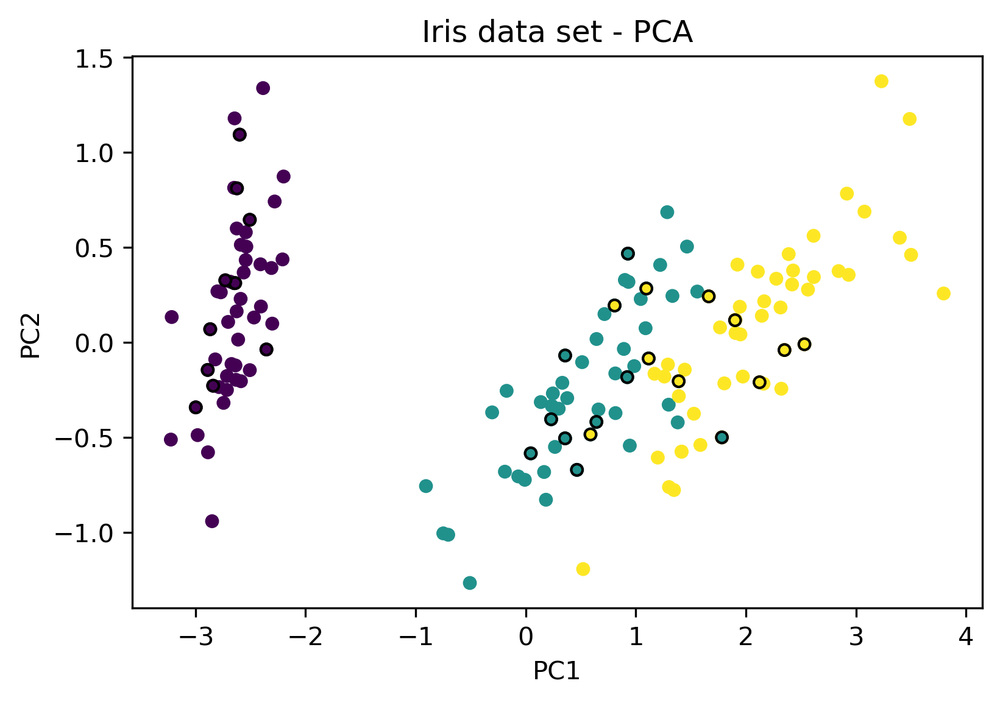

In [43]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(iris2D[:,0], iris2D[:,1],  
            c= np.choose(iris.target, [0, 1, 2]).astype(float), s=20)

# Create scatter plot
plt.scatter(pcaObj.transform(iris_X_test)[:,0], pcaObj.transform(iris_X_test)[:,1],  
            c=iris_y_pred, edgecolor='k', s=20)

# for name, label in [('Setosa', 0),
#                     ('Versicolour', 1),
#                     ('Virginica', 2)]:
#     ax.text(iris2D[iris.target == label, 0].mean(),
#             iris2D[iris.target == label, 1].mean(), name,
#                   horizontalalignment='center',
#                   bbox=dict(alpha=.2, edgecolor='w', facecolor='w'))

# Set figure title
ax.set_title('Iris data set - PCA')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')

plt.show()

In [44]:
score = svcIris.score(iris_X_test, iris_y_test)

print("The model accuracy is {}%".format(int(round(score, 2)*100)))

The model accuracy is 83%


Using all four dimensions gives us a significant increase in accuracy, from an overall of 73% to 83% model accuracy.
Now we will try going back to only two dimensions, but using the Principal Components as the input variables for model training:

In [45]:
iris2D_X_train, iris2D_X_test, iris2D_y_train, iris2D_y_test = train_test_split(
    iris2D, iris.target, test_size=0.2, random_state=12345)

In [46]:
svcIris2D = make_pipeline(StandardScaler(),
                    LinearSVC(random_state=0, tol=1e-5))

svcIris2D.fit(iris_X_train, iris_y_train)

iris2D_y_pred = svcIris2D.predict(iris_X_test)

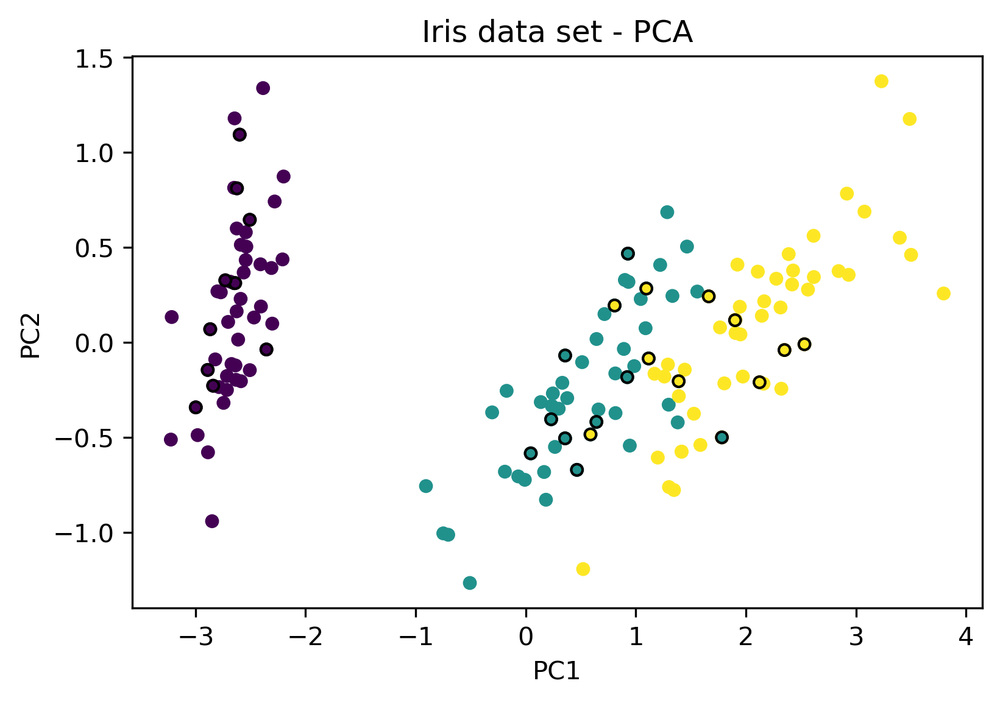

In [47]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(iris2D[:,0], iris2D[:,1],  
            c= np.choose(iris.target, [0, 1, 2]).astype(float), s=20)

# Create scatter plot
plt.scatter(iris2D_X_test[:,0], iris2D_X_test[:,1],  
            c=iris2D_y_pred, edgecolor='k', s=20)

# for name, label in [('Setosa', 0),
#                     ('Versicolour', 1),
#                     ('Virginica', 2)]:
#     ax.text(iris2D[iris.target == label, 0].mean(),
#             iris2D[iris.target == label, 1].mean(), name,
#                   horizontalalignment='center',
#                   bbox=dict(alpha=.2, edgecolor='w', facecolor='w'))

# Set figure title
ax.set_title('Iris data set - PCA')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')

plt.show()

In [48]:
score = svcIris2D.score(iris_X_test, iris_y_test)

print("The model accuracy is {}%".format(int(round(score, 2)*100)))

The model accuracy is 83%


Again we see that the SVM classifier achieves an 83% accuracy, but using only 2 dimensions as input. Clearly, for this data set, the dimensionaly can be reduced through PCA while maintaining a good level of information, at least sufficient to achieve the same classification accuracy as when using the full data set.

This toy example was chosen to easily illustrate important concepts of dimensionality reduction, but in larger data sets (such as those with many dozens to many hundreds of dimensions), reducing the dimensionaly can be even more beneficial. It can highlight features that an SVM (or other) model may have problems finding when working with 500 dimensions instead of 5.

Now, for a last classification example using the SVM, we will change how the classifier processes the data it is given:

In [49]:
svcIris2DRBF = make_pipeline(StandardScaler(),
                    SVC(kernel="rbf", random_state=0, tol=1e-5))

svcIris2DRBF.fit(iris_X_train, iris_y_train)

iris2Drbf_y_pred = svcIris2DRBF.predict(iris_X_test)

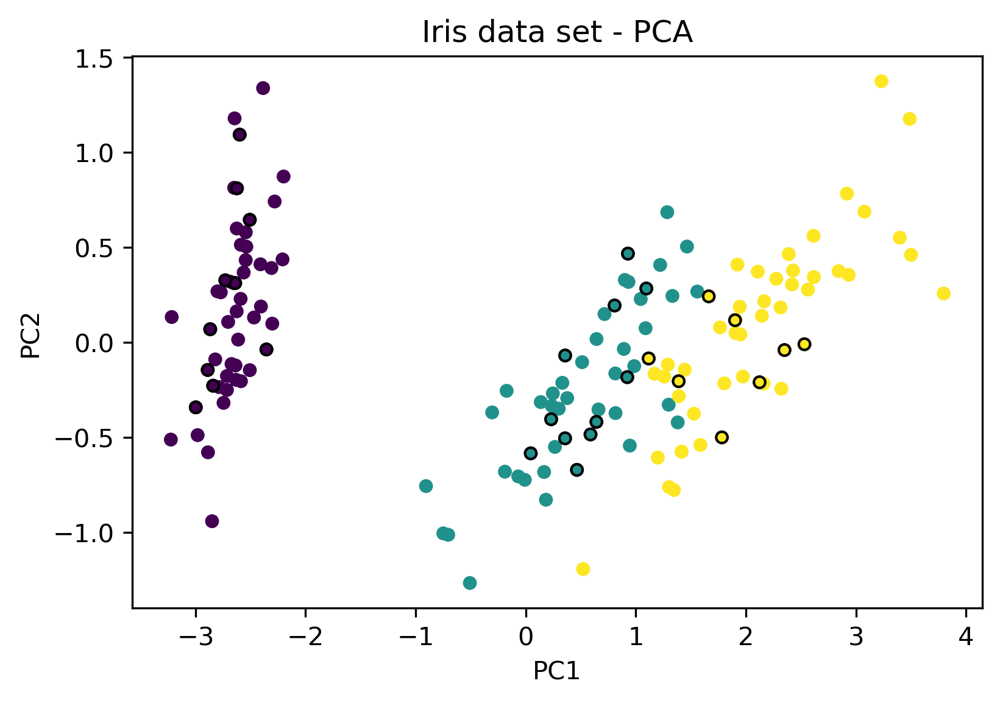

In [50]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(iris2D[:,0], iris2D[:,1],  
            c= np.choose(iris.target, [0, 1, 2]).astype(float), s=20)

# Create scatter plot
plt.scatter(iris2D_X_test[:,0], iris2D_X_test[:,1],  
            c=iris2Drbf_y_pred, edgecolor='k', s=20)

# for name, label in [('Setosa', 0),
#                     ('Versicolour', 1),
#                     ('Virginica', 2)]:
#     ax.text(iris2D[iris.target == label, 0].mean(),
#             iris2D[iris.target == label, 1].mean(), name,
#                   horizontalalignment='center',
#                   bbox=dict(alpha=.2, edgecolor='w', facecolor='w'))

# Set figure title
ax.set_title('Iris data set - PCA')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')

plt.show()

In [51]:
score = svcIris2DRBF.score(iris_X_test, iris_y_test)

print("The model accuracy is {}%".format(int(round(score, 2)*100)))

The model accuracy is 97%


Here, we use the Principal Components as before, but attempt a different kernel for the clasisfier. In this case, the accuracy jumps to an impressive 97%. The Radial Basis Function allows for non-linear relation between variables to be explored when training the model, and in this case extracts more information from the PC dimensions. Kernels will be further explored below.

Now, we will turn to the other possible use of SVMs, and train a regressor model for the diabetes dataset using all available data from each patient.

In [52]:
# Create the diabetes training ans testing data sets.
db_X_train, db_X_test, db_y_train, db_y_test = train_test_split(
    diabetes.data, diabetes.target, test_size=0.2, random_state=12345)

In [53]:
# Initialize the training pipeline
svrLinDB = make_pipeline(StandardScaler(),
                    LinearSVR(random_state=0, tol=1e-5))

# Fit the model on the training data set
svrLinDB.fit(db_X_train, db_y_train)

# Predict diabetes progression after one year.
db_yLinDB_pred = svrLinDB.predict(db_X_test)

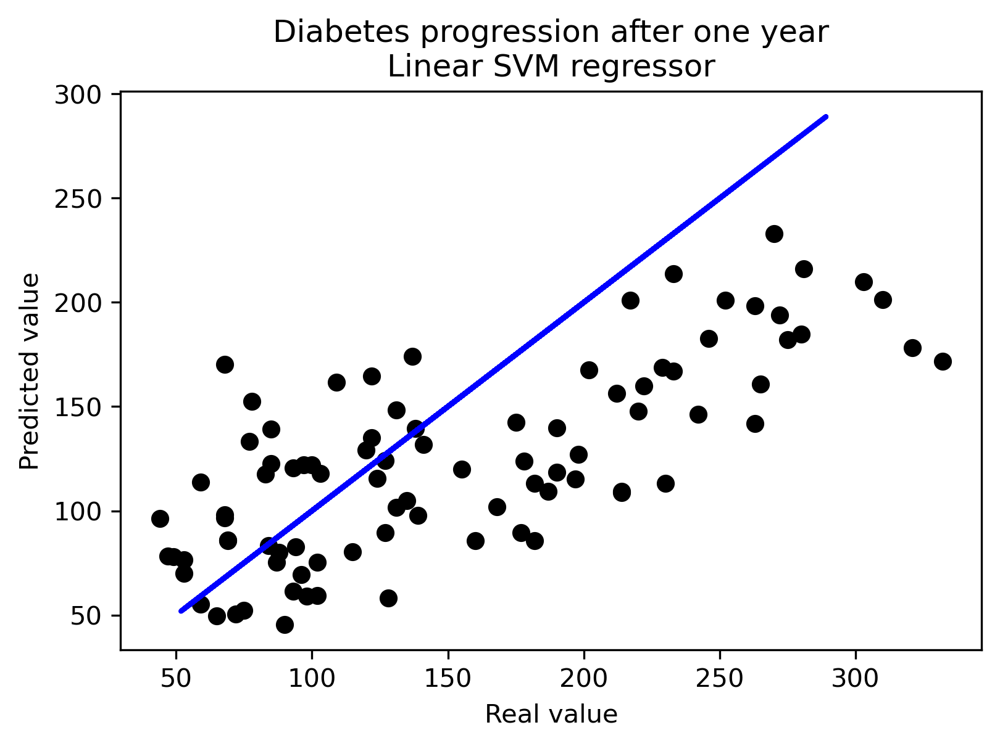

In [54]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(db_y_test, db_yLinDB_pred,  color='black')
plt.plot(db_y_pred, db_y_pred, color='blue', linewidth=2)

# Set figure title
ax.set_title('Diabetes progression after one year\nLinear SVM regressor')
ax.set_xlabel('Real value')
ax.set_ylabel('Predicted value')

plt.show()

In [55]:
result = sp.stats.pearsonr(db_y_test, db_yLinDB_pred)
print("Pearson correlation coefficient: {}".format(round(result[0],3)))
print("P-value for non-correlation: {}".format(result[1]))

Pearson correlation coefficient: 0.735
P-value for non-correlation: 2.24520663330183e-16


### Kernels and Tricks

As an example for the use of data transformations and kernel trics, we will use the Noisy Moons data set created above for the classification benchmarks.

In [56]:
# Recreate the data set.
nm_X_train, nm_X_test, nm_y_train, nm_y_test = train_test_split(
    noisy_moons[0], noisy_moons[1], test_size=0.2, random_state=12345)

In [57]:
# Extract a single half moon from the data set
noisy_moon = noisy_moons[0][noisy_moons[1] == 1]

In [58]:
# Split training and testing sets for one half moon.
nms_X_train, nms_X_test, nms_y_train, nms_y_test = train_test_split(
    noisy_moon[:,0], noisy_moon[:,1], test_size=0.2, random_state=12345)

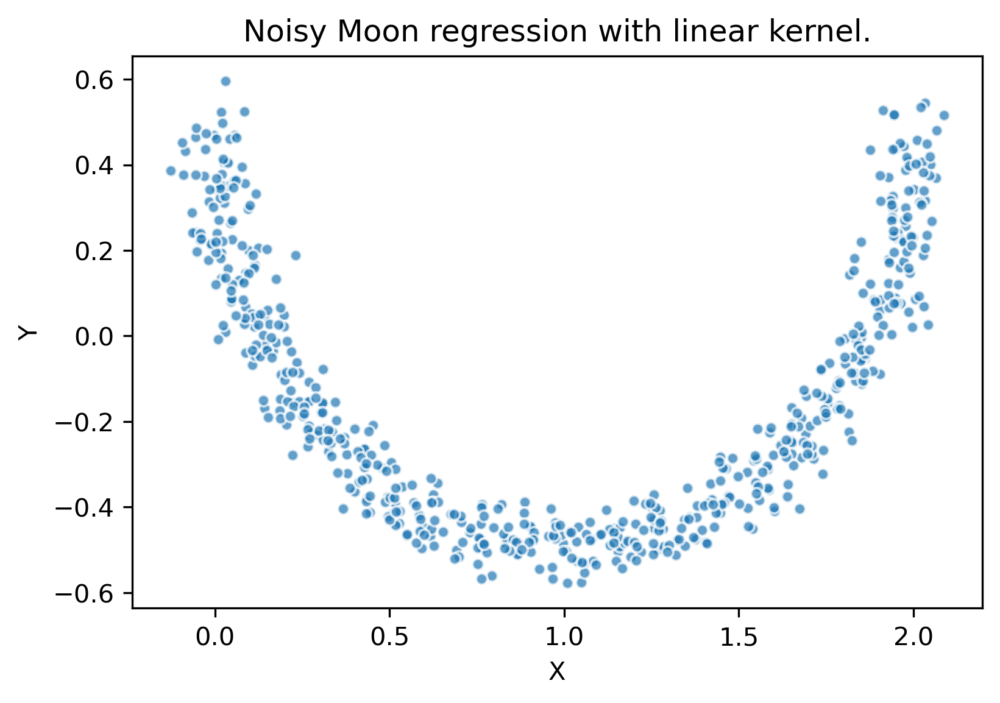

In [59]:
# Initialize figure
fig, ax = plt.subplots()

plt.scatter(nms_X_train, nms_y_train,  
            edgecolor='w', s=20, alpha=0.7)

# Set figure title
ax.set_title('Noisy Moon regression with linear kernel.')
ax.set_xlabel('X')
ax.set_ylabel('Y')

plt.show()

The data we chose to model is shaped as a single half moon, and intuitively can be modelled by a second degree polynomial function.
We will now try to train a SVM regressor using the standard linear kernel directly on the original data. The process is probably familiar by now, and follows the same steps we have been using in previous examples.

In [60]:
# Load necessary libraries 
from sklearn.svm import LinearSVR, SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

# Initialize pipeline
svr = make_pipeline(StandardScaler(),
                    LinearSVR(random_state=0, tol=1e-5))

# Train model
svr.fit(nms_X_train.reshape(-1, 1), nms_y_train)

# Predict values
nms_y_pred = svr.predict(nms_X_test.reshape(-1, 1))

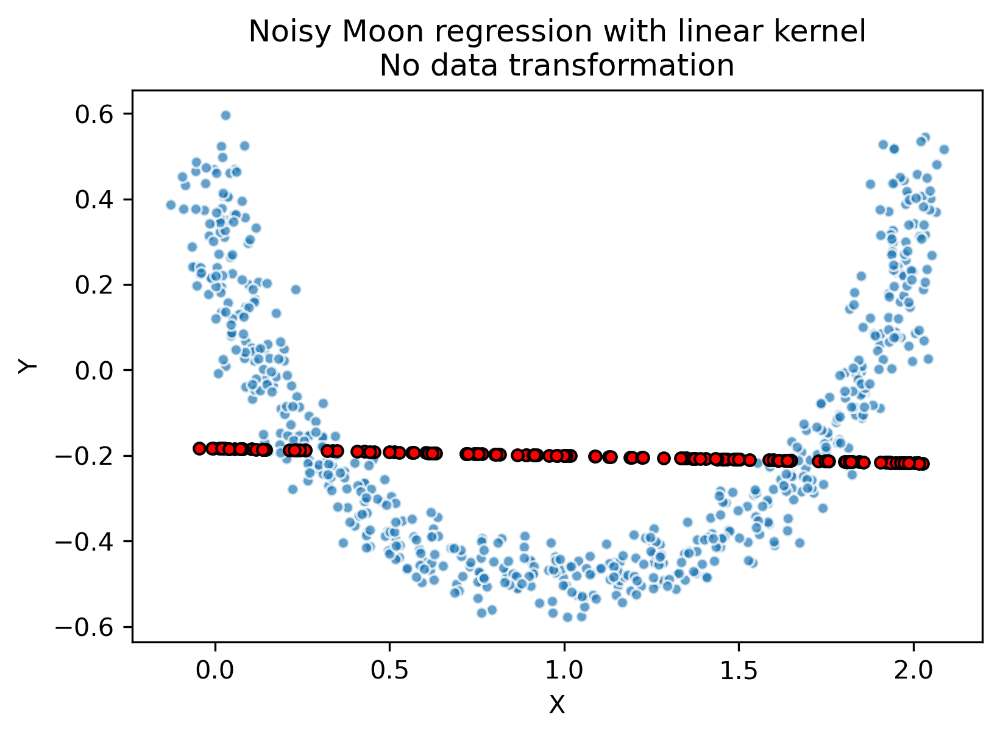

In [61]:
# Initialize figure
fig, ax = plt.subplots()

plt.scatter(nms_X_train, nms_y_train,  
            edgecolor='w', s=20, alpha=0.7)

# Create scatter plot for the test set
plt.scatter(nms_X_test, nms_y_pred,  
            color="red", edgecolor='k', s=20)

# Set figure title
ax.set_title('Noisy Moon regression with linear kernel\nNo data transformation')
ax.set_xlabel('X')
ax.set_ylabel('Y')

plt.show()

As expected, the predicted values (red dots) do not follow the data distribution at all. Since we are using a linear kernel, the predictions unsurprisingly follow a straight line.

However, if we transform the data using the polynomial transformation described bellow, we can use the same linear kernel and achieve a much better result:

$$
f(x) = \begin{pmatrix} \sqrt{2} \cdot x \\ x^2 \end{pmatrix}
$$

This is because we have now transformed our 1D input variable $x$ in a 2D data set that follows the distribution of the target values in $y$. By mapping the input onto a higher dimensional space, we allows the SVM model to find the simple pattern that us, humans, can intuitively see in the figure.

In [62]:
# Define the transformation
def polTransf(x):
    return [np.sqrt(2)*x, x**2]

# Apply transformation on training and testing input variable data sets.
nms_Xpol_train = [polTransf(coords) for coords in nms_X_train ]
nms_Xpol_train = np.asarray(nms_Xpol_train)

nms_Xpol_test = [polTransf(coords) for coords in nms_X_test ]
nms_Xpol_test = np.asarray(nms_Xpol_test)

In [63]:
# Initialize a new model object (this now takes in a 2D input)
svcTrans = make_pipeline(StandardScaler(),
                    LinearSVR(random_state=0, tol=1e-5))

# Fit the model
svcTrans.fit(nms_Xpol_train, nms_y_train)

# Predict targets
nms_ypol_pred = svcTrans.predict(nms_Xpol_test)

/home/melomcr/anaconda3/envs/ML_Env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


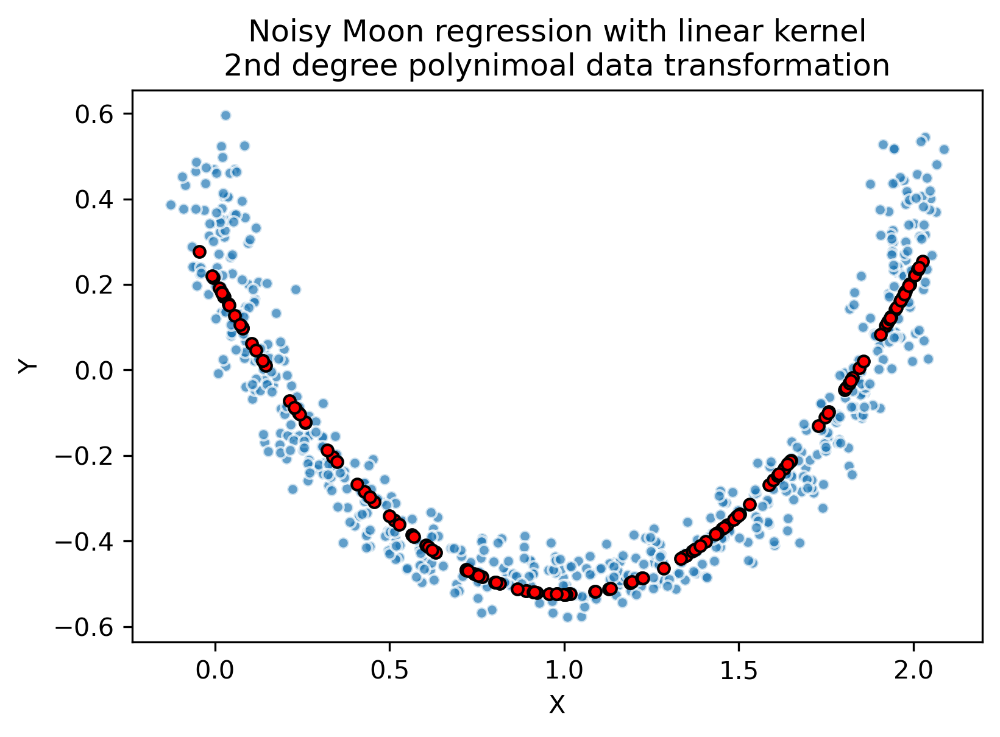

In [64]:
# Initialize figure
fig, ax = plt.subplots()

plt.scatter(nms_X_train, nms_y_train,  
            edgecolor='w', s=20, alpha=0.7)

# Create scatter plot for the test set
plt.scatter(nms_X_test, nms_ypol_pred,  
            color="red", edgecolor='k', s=20)

# Set figure title
ax.set_title('Noisy Moon regression with linear kernel\n2nd degree polynimoal data transformation')
ax.set_xlabel('X')
ax.set_ylabel('Y')

plt.show()

As expected, the transformed input allows the model to find the pattern and correctly predict the target values for the testing set.

We can avoid manually defining transformation functions and manually transforming data by using pre-defined kernels in our SVM regressor. For a number of transformations, the desired kernel can be specified as an argument when creating the model object, and kernel options can be passed transparently by the user. We encourage the reader to explore this topic in SciKit-Learn documentation.

In the following example, we will show how the kernel itself can be called to implicitly transform the input data, and achieve the same results we just saw when manually transforming the input data.

In [65]:
# Initialize a pipeline with an SVM regressor that uses the polynomial kernel.
svrPoly = make_pipeline(StandardScaler(),
                    SVR(kernel="poly", degree=2, tol=1e-5))

# Fit model using the 1D original data set.
svrPoly.fit(nms_X_train.reshape(-1, 1), nms_y_train)

# Predict target values.
nms_yKPoly_pred = svrPoly.predict(nms_X_test.reshape(-1, 1))

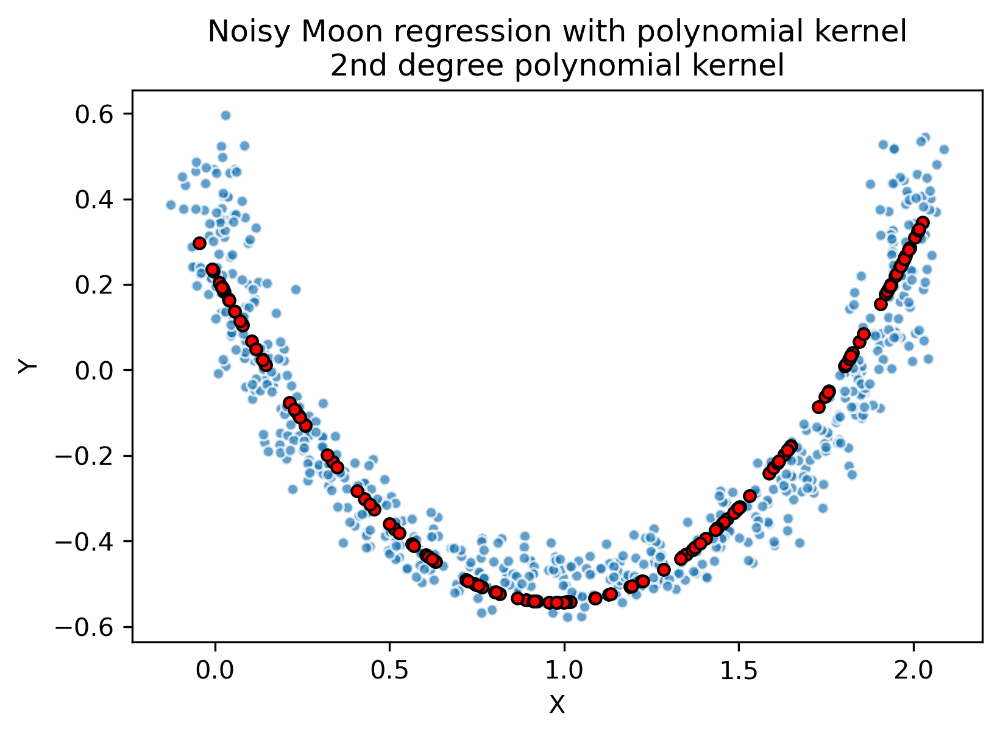

In [66]:
# Initialize figure
fig, ax = plt.subplots()

plt.scatter(nms_X_train, nms_y_train,  
            edgecolor='w', s=20, alpha=0.7)

# Create scatter plot for the test set
plt.scatter(nms_X_test, nms_yKPoly_pred,  
            color="red", edgecolor='k', s=20)

# Set figure title
ax.set_title('Noisy Moon regression with polynomial kernel\n2nd degree polynomial kernel')
ax.set_xlabel('X')
ax.set_ylabel('Y')

plt.show()

Since the implicit transformation by the 2nd degree polynomial kernel works so well, we can change one argument and check what a 3rd degree polynomial transformation would do to our model.

In [67]:
svrPoly3 = make_pipeline(StandardScaler(),
                    SVR(kernel="poly", degree=3, tol=1e-5))

svrPoly3.fit(nms_X_train.reshape(-1, 1), nms_y_train)

nms_yKPoly3_pred = svrPoly3.predict(nms_X_test.reshape(-1, 1))

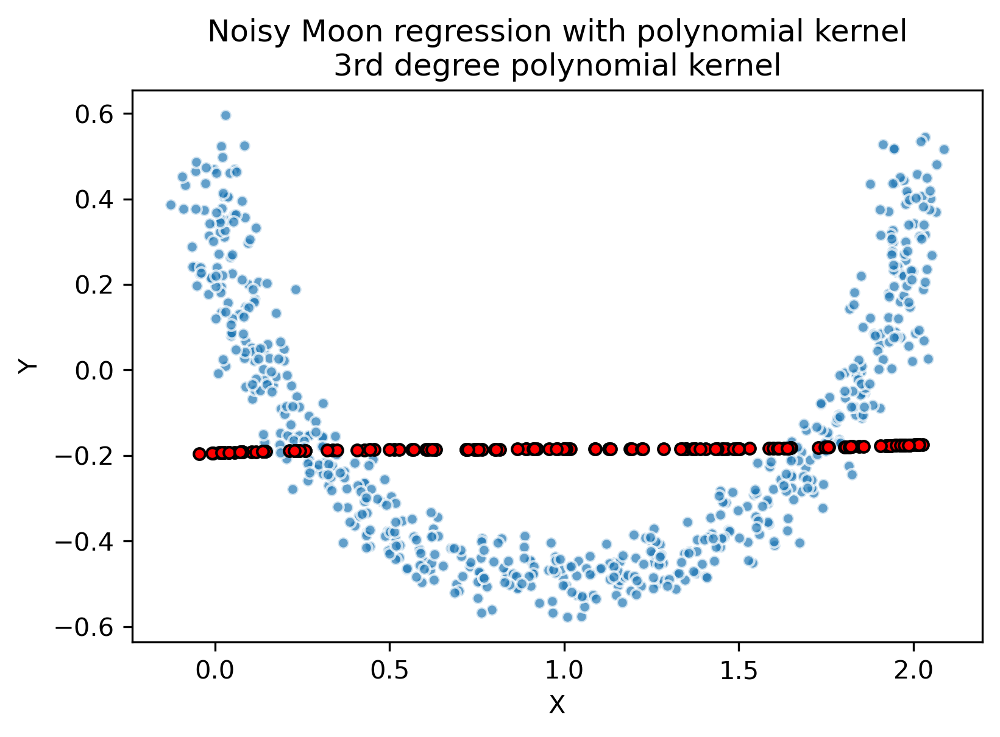

In [68]:
# Initialize figure
fig, ax = plt.subplots()

plt.scatter(nms_X_train, nms_y_train,  
            edgecolor='w', s=20, alpha=0.7)

# Create scatter plot for the test set
plt.scatter(nms_X_test, nms_yKPoly3_pred,  
            color="red", edgecolor='k', s=20)

# Set figure title
ax.set_title('Noisy Moon regression with polynomial kernel\n3rd degree polynomial kernel')
ax.set_xlabel('X')
ax.set_ylabel('Y')

plt.show()

In this case, the 3rd degree transformation actually made it more difficult for the model to learn from the training set and correctly predict the target variables.

# Using a Radial Basis Function kernel for an SVM classifier

The following section is used as a self-contained example in the book, and takes the reader through every step in creating classification models based on SVMs. We load all necessary libraries for data preparation, processing, model creation.

The example here shows the power of using the kernel trick to train a Support Vector Classifier with a Radial Basis Function kernel. This data transformation allows the model to distinguish two classes of points in a 2D plane, and avoids any explicit and arbitrary data transformation steps. As a control experiment, we first attempt to classify points using only a linear kernel, but since the data clearly has a non-linear nature, the model unsurprisingly fails to correctly classify the test data set.

In [69]:
### Load modules to create and split data sets.
from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split

### Load modules to prepare data and train SVC model.
from sklearn.svm import LinearSVC, SVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

In [70]:
# Prepare data distributed in half moons.
noisy_moons = make_moons(n_samples=1500, noise=.05)

# Split data set into training and testing sets.
nm_X_train, nm_X_test, nm_y_train, nm_y_test = train_test_split(
    noisy_moons[0], noisy_moons[1], test_size=0.2, random_state=12345)

In [71]:
# Prepare PipeLine to autimatically apply data scaling before calling SVC model.
svc = make_pipeline(StandardScaler(),
                    LinearSVC(random_state=0, tol=1e-5))

# Fit the model using the training data.
svc.fit(nm_X_train, nm_y_train)

# Predict class for data points in the test set.
nm_y_pred = svc.predict(nm_X_test)

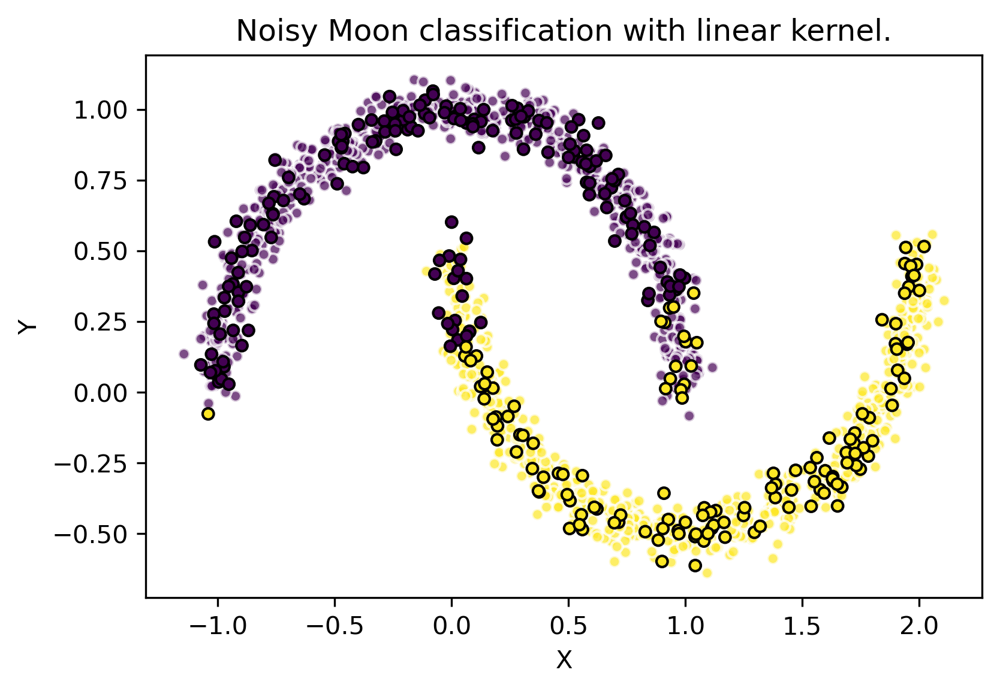

In [72]:
# Initialize figure
fig, ax = plt.subplots()

plt.scatter(nm_X_train[:,0], nm_X_train[:,1],  
            c= nm_y_train, edgecolor='w', s=20, alpha=0.7)

# Create scatter plot for the test set
plt.scatter(nm_X_test[:,0], nm_X_test[:,1],  
            c= nm_y_pred, edgecolor='k', s=20)

# Set figure title
ax.set_title('Noisy Moon classification with linear kernel.')
ax.set_xlabel('X')
ax.set_ylabel('Y')

plt.show()

In [73]:
# Prepare PipeLine to autimatically apply data scaling before calling SVC model.
svcRBF = make_pipeline(StandardScaler(),
                    SVC(kernel="rbf", random_state=0, tol=1e-5))

# Fit the model using the training data.
svcRBF.fit(nm_X_train, nm_y_train)

# Predict class for data points in the test set.
nm_yRBF_pred = svcRBF.predict(nm_X_test)

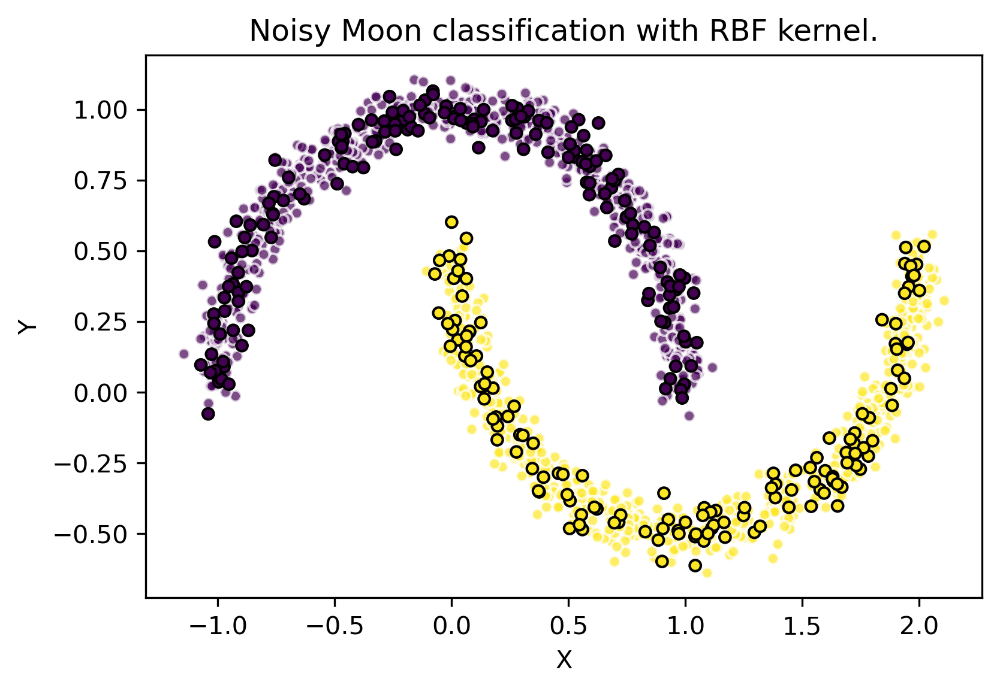

In [74]:
# Initialize figure
fig, ax = plt.subplots()

plt.scatter(nm_X_train[:,0], nm_X_train[:,1],  
            c= nm_y_train, edgecolor='w', s=20, alpha=0.7)

# Create scatter plot for the test set
plt.scatter(nm_X_test[:,0], nm_X_test[:,1],  
            c= nm_yRBF_pred, edgecolor='k', s=20)

# Set figure title
ax.set_title('Noisy Moon classification with RBF kernel.')
ax.set_xlabel('X')
ax.set_ylabel('Y')

plt.show()

# Dimensionality reduction examples

Here we will show the effect some dimentionality reduction techniques have on a complex data set.

This is based on an example from [Scikit-Learn](https://scikit-learn.org/stable/auto_examples/manifold/plot_compare_methods.html).

We will first generate a 3D data set in the shape of an "S", and the visualize it in a 3D plot.

In [75]:
### Load modules to create complex data set.
from sklearn.datasets import make_s_curve

# This function automatically creates a distribution of points in 3D space in the
#   shape of as "S".
sDat, sColor = make_s_curve(1000, random_state=12345, )

n_neighbors = 10
n_components = 2

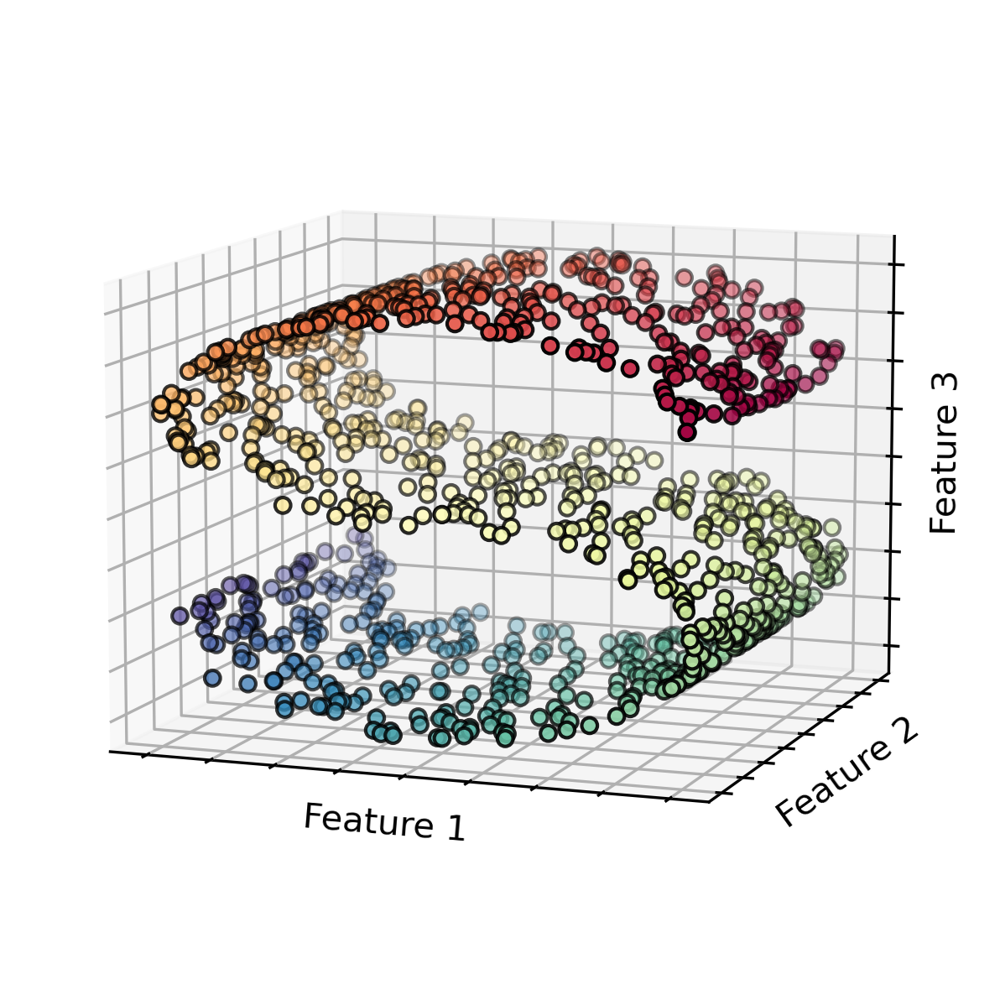

In [76]:
# Initialize figure
fig = plt.figure(figsize=(5, 5))

# Create the first sub-plot with points colored by clustering class.
ax = fig.add_subplot(1, 1, 1, projection='3d')

ax.scatter(sDat[:, 0], sDat[:, 1], sDat[:, 2], c=sColor, cmap=plt.cm.Spectral, edgecolor='k')

ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
ax.set_zlabel('Feature 3')

ax.view_init(elev=10, azim=- 70)

ax.xaxis.set_ticklabels([])
ax.yaxis.set_ticklabels([])
ax.zaxis.set_ticklabels([])

ax.xaxis.labelpad=-10
ax.yaxis.labelpad=-10
ax.zaxis.labelpad=-10
    
plt.show()

We can now show the same data in 2D if we **manually** choose to use just 2 of the 3 features that each sample has:

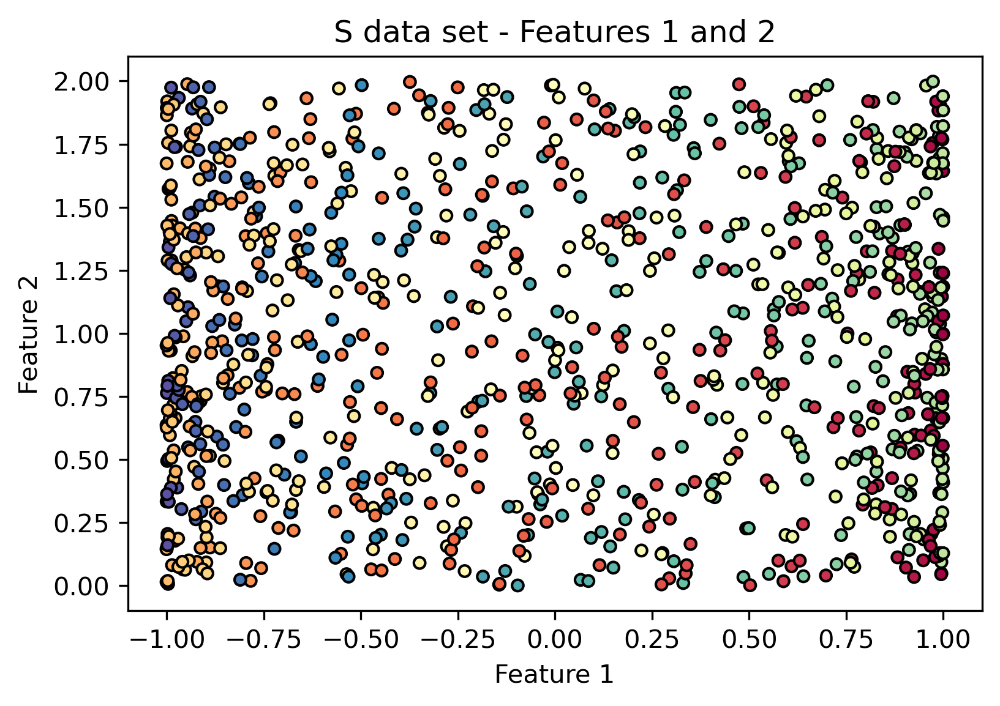

In [77]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(sDat[:,0], sDat[:,1],  
            c= sColor, cmap=plt.cm.Spectral, edgecolor='k', s=20)

# Set figure title
ax.set_title('S data set - Features 1 and 2')
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')

plt.show()

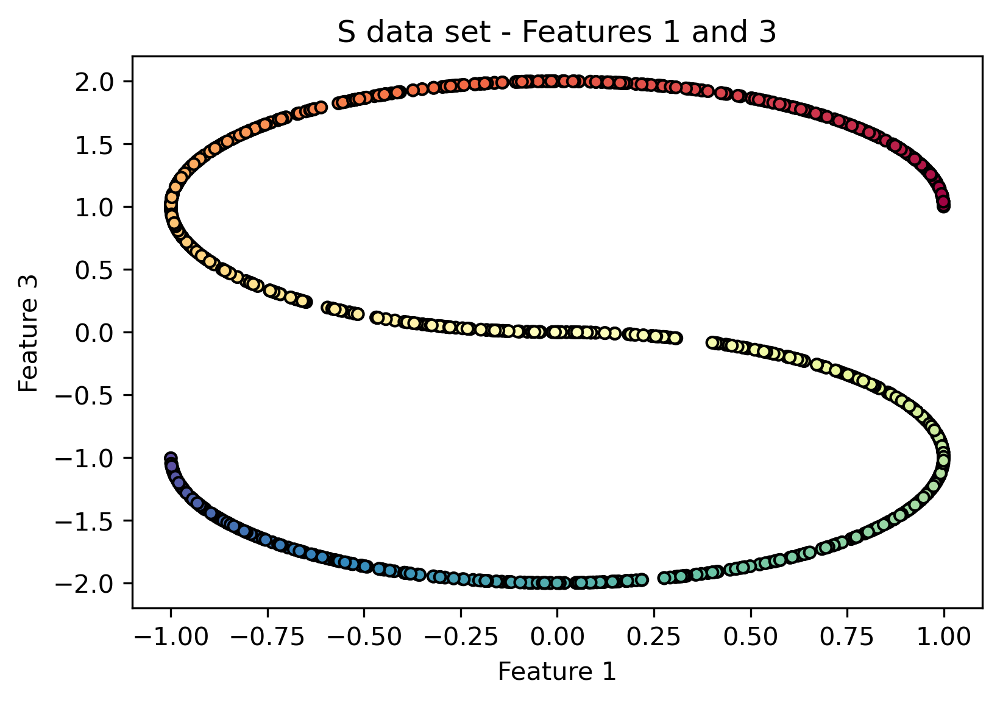

In [78]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(sDat[:,0], sDat[:,2],  
            c= sColor, cmap=plt.cm.Spectral, edgecolor='k', s=20)

# Set figure title
ax.set_title('S data set - Features 1 and 3')
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 3')

plt.show()

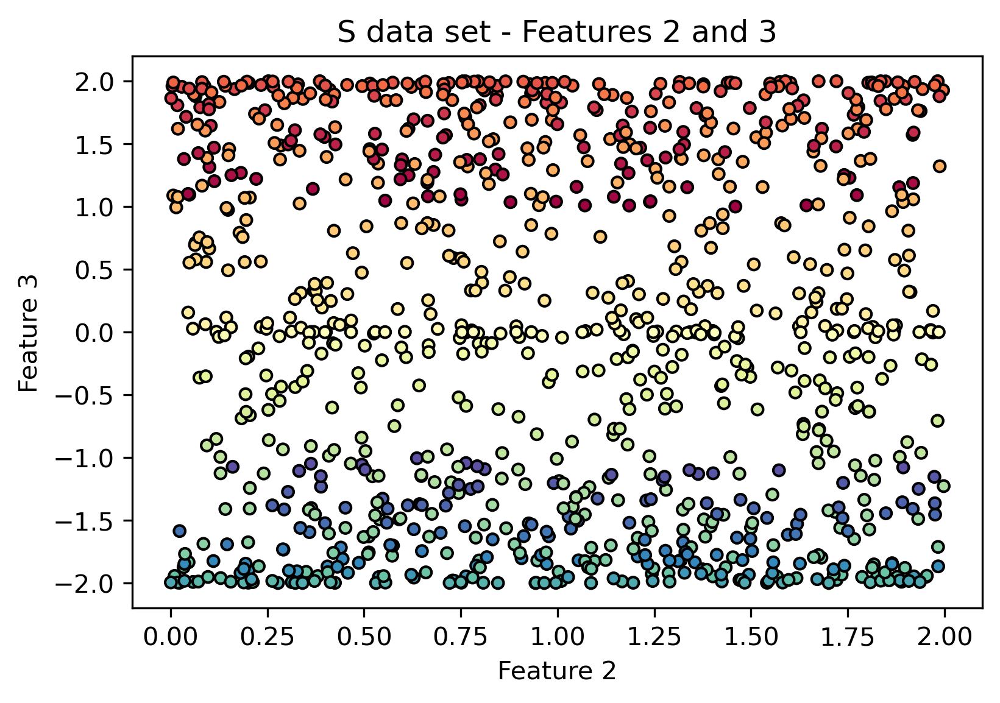

In [79]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(sDat[:,1], sDat[:,2],  
            c= sColor, cmap=plt.cm.Spectral, edgecolor='k', s=20)

# Set figure title
ax.set_title('S data set - Features 2 and 3')
ax.set_xlabel('Feature 2')
ax.set_ylabel('Feature 3')

plt.show()

Now we can apply dimensionality reduction techniques to see how they describe the data set.

First with PCA:

In [80]:
from sklearn.decomposition import PCA

# Initialize the PCA object and directs it to project the data onto a 2D space.
pcaObjS = PCA(n_components=2, svd_solver="full")

# In this case, the fit_transform method optimizes the principal components and projects the data set.
sDatPCA = pcaObjS.fit_transform(sDat)

# The PCA object can tell us variance ratio explained by each component.
pcaObjS.explained_variance_ratio_

array([0.70304075, 0.17764096])

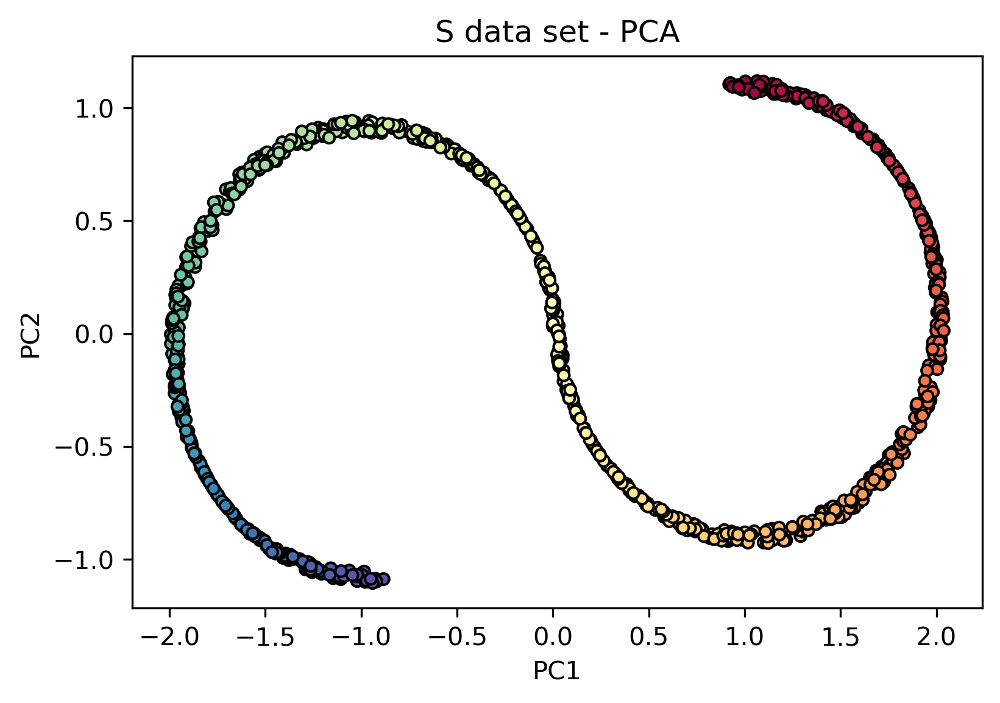

In [81]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(sDatPCA[:,0], sDatPCA[:,1],  
            c= sColor, cmap=plt.cm.Spectral, edgecolor='k', s=20)

# Set figure title
ax.set_title('S data set - PCA')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')

plt.show()

Now with tSNE:

In [82]:
# Load the tSNE class
from sklearn.manifold import TSNE

# Initialize the tSNE object and directs it to project the data onto a 2D space. 
# Warning! The "n_iter_without_progress" was reduced to avoid a very long processing time.
tsneObjS = TSNE(n_components=2, n_iter=1000, n_iter_without_progress=50, random_state=12345)

# In this case, the fit_transform method optimizes the distances of nearby points in the reduced 2D space.
sDatTSNE = tsneObjS.fit_transform(sDat)

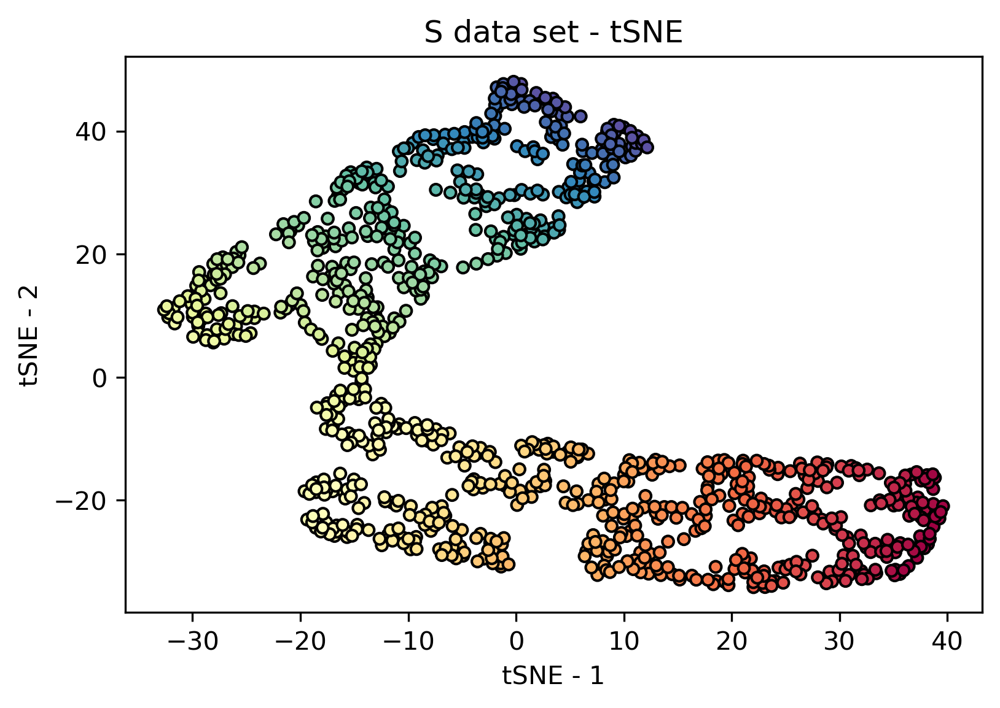

In [83]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(sDatTSNE[:,0], sDatTSNE[:,1],  
            c= sColor, cmap=plt.cm.Spectral, edgecolor='k', s=20)

# Set figure title
ax.set_title('S data set - tSNE')
ax.set_xlabel('tSNE - 1')
ax.set_ylabel('tSNE - 2')

plt.show()

Now with MDS:

In [84]:
# Load the MDS class
from sklearn.manifold import MDS

# Initialize the MDS object and directs it to project the data onto a 2D space. 
mdsObjS = MDS(n_components=2, max_iter=100, n_init=1, random_state=12345)

# In this case, the fit_transform method optimizes the distances of nearby points in the reduced 2D space.
sDatMDS = mdsObjS.fit_transform(sDat)

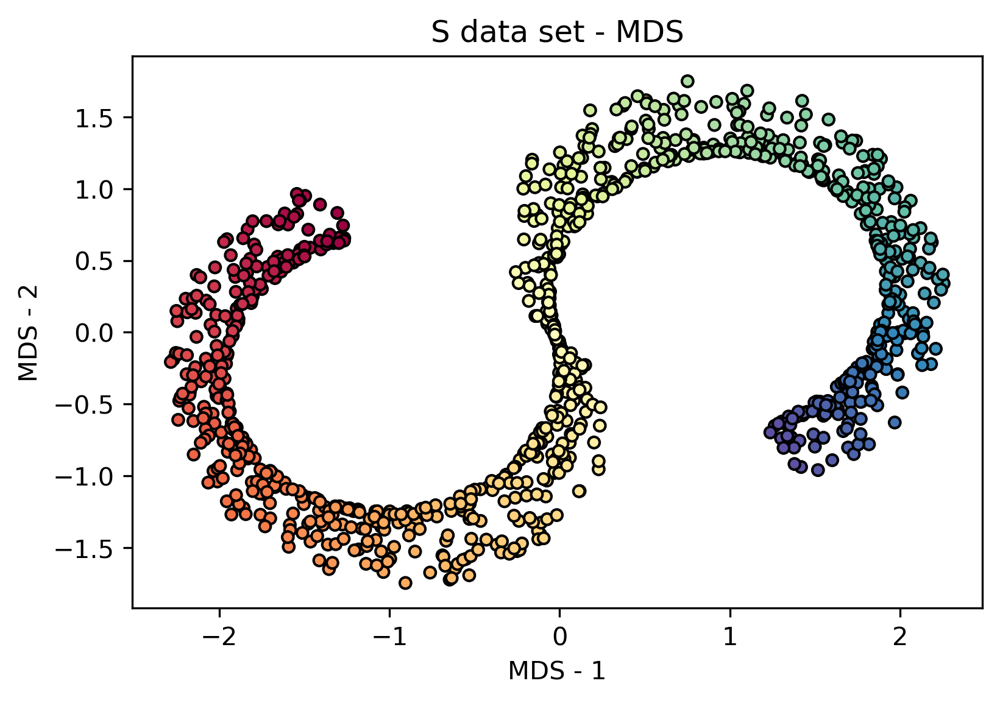

In [85]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(sDatMDS[:,0], sDatMDS[:,1],  
            c= sColor, cmap=plt.cm.Spectral, edgecolor='k', s=20)

# Set figure title
ax.set_title('S data set - MDS')
ax.set_xlabel('MDS - 1')
ax.set_ylabel('MDS - 2')

plt.show()

Now with LLE:

In [86]:
# Load the MDS class
from sklearn.manifold import LocallyLinearEmbedding as LLE

# Initialize the LLE object and directs it to project the data onto a 2D space. 
lleObjS = LLE(method='standard', n_components=2, n_neighbors=20, max_iter=100, random_state=12345)

# In this case, the fit_transform method optimizes the distances of nearby points in the reduced 2D space.
sDatLLE = lleObjS.fit_transform(sDat)

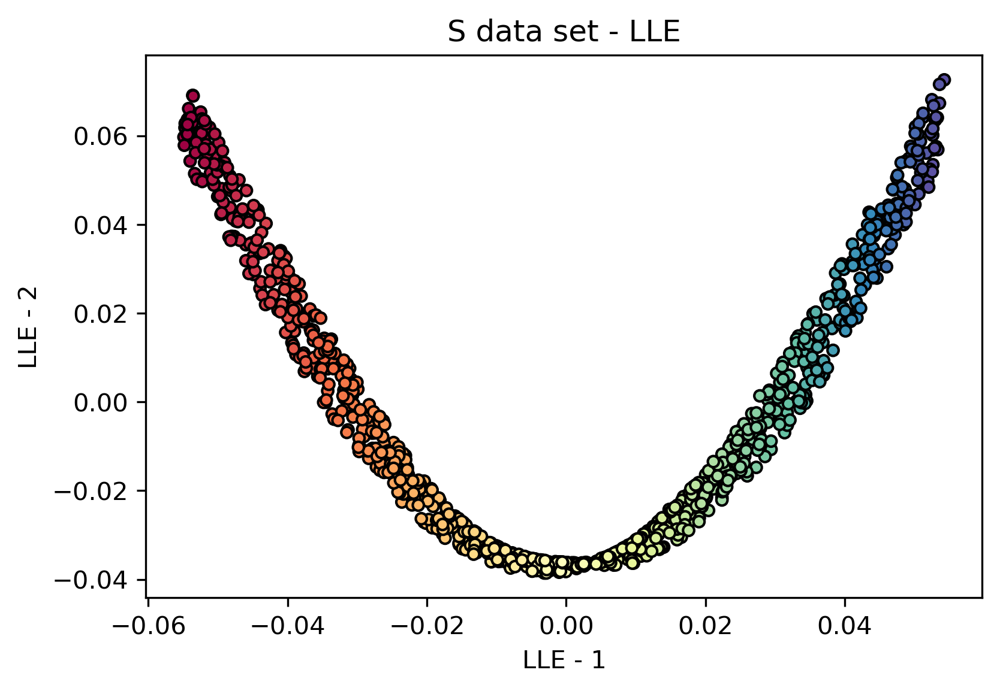

In [87]:
# Initialize figure
fig, ax = plt.subplots()

# Create scatter plot
plt.scatter(sDatLLE[:,0], sDatLLE[:,1],  
            c= sColor, cmap=plt.cm.Spectral, edgecolor='k', s=20)

# Set figure title
ax.set_title('S data set - LLE')
ax.set_xlabel('LLE - 1')
ax.set_ylabel('LLE - 2')

plt.show()